# Customer Segmentation of Retail Store

This notebook analyzes retail transactional data to uncover trends, patterns, and insights that inform business strategies.

## Problem Statement
Analyze a comprehensive retail dataset containing customer demographics, purchase behaviors, products, transactions, and feedback to uncover trends, patterns, and insights that inform business strategies and decisions.

## Dataset Description
- **Number of rows**: 302,010
- **Number of columns**: 30
- **Numerical columns**: 10
- **Categorical columns**: 20

## Data Cleaning
- **Duplicate Rows**: 4
- **Null Values**: 8,098 rows with missing values
- **Imputation**: Null values imputed in 15 columns
- **Dropped Columns**: 12
- **Feature Engineering**: Derived additional columns for analysis.

## Exploratory Data Analysis
### Outliers
Outliers were identified in the `Total Amount` column and were transformed for better analysis.

### Univariate Analysis
1. **Yearly Trend**: 2023 has more data points than 2024, indicating higher activity or a longer data collection period.
2. **Seasonal Patterns**: January has the highest activity, while November-December has lower activity.
3. **Product Categories**: Grocery dominates sales, followed by Electronics.
4. **Work Hours Distribution**: Majority of work is done outside regular office hours.
5. **Gender Distribution**: Males outnumber females nearly 2:1.
6. **Income Distribution**: High-income individuals dominate, suggesting an affluent customer base.

## Bivariate Analysis
### Income-Based Consumer Behavior
Higher income correlates with significantly higher spending.

### Age-Based Consumer Behavior
No strong age-based spending patterns, although older customers may spend more.

### Product Analysis
Product categories show varying total amounts spent, with Grocery having the highest and Home Décor the least.

## Multivariate Analysis
- Correlation matrix indicates positive correlations between spending variables.
- Age has weak influence on spending behavior.

## Statistical Tests
A t-test was conducted to compare the means of training and test datasets. With a p-value greater than 0.05, we conclude that both datasets represent the overall data well.

## Data Preprocessing
- **Encoding**:
  - Label Encoding: Applied to columns like `Month`, `Product_Type`, etc.
  - One-Hot Encoding: Applied to `Region`, `Gender`, etc.
- **Scaling**:
  - Standard scaling applied to all columns before PCA.

## Base Model
The base model used for classification is Logistic Regression.

## Model Comparison and Hyperparameter Tuning
Additional models were compared, and hyperparameter tuning was conducted to select the best-performing model.

## Final Model & Conclusions
Summarize the final model used and key business insights derived from the analysis.

## Limitations
Discuss any challenges or limitations encountered during the analysis.

In [1]:
pip install swifter

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install gender_guesser

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from warnings import filterwarnings
filterwarnings('ignore')

import swifter
import gender_guesser.detector as gender

In [4]:
pd.set_option('display.max_columns',None)

In [5]:
df= pd.read_csv('new_retail_data.csv')
df.head()

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
0,8691788.0,37249.0,Michelle Harrington,Ebony39@gmail.com,1.414787e+09,3959 Amanda Burgs,Dortmund,Berlin,77985.0,Germany,21.0,Male,Low,Regular,9/18/2023,2023.0,September,22:03:55,3.0,108.028757,324.086270,Clothing,Nike,Shorts,Excellent,Same-Day,Debit Card,Shipped,5.0,Cycling shorts
1,2174773.0,69749.0,Kelsey Hill,Mark36@gmail.com,6.852900e+09,82072 Dawn Centers,Nottingham,England,99071.0,UK,19.0,Female,Low,Premium,12/31/2023,2023.0,December,8:42:04,2.0,403.353907,806.707815,Electronics,Samsung,Tablet,Excellent,Standard,Credit Card,Processing,4.0,Lenovo Tab
2,6679610.0,30192.0,Scott Jensen,Shane85@gmail.com,8.362160e+09,4133 Young Canyon,Geelong,New South Wales,75929.0,Australia,48.0,Male,Low,Regular,4/26/2023,2023.0,April,4:06:29,3.0,354.477600,1063.432799,Books,Penguin Books,Children's,Average,Same-Day,Credit Card,Processing,2.0,Sports equipment
3,7232460.0,62101.0,Joseph Miller,Mary34@gmail.com,2.776752e+09,8148 Thomas Creek Suite 100,Edmonton,Ontario,88420.0,Canada,56.0,Male,High,Premium,5/8/2023,2023.0,May,14:55:17,7.0,352.407717,2466.854021,Home Decor,Home Depot,Tools,Excellent,Standard,PayPal,Processing,4.0,Utility knife
4,4983775.0,27901.0,Debra Coleman,Charles30@gmail.com,9.098268e+09,5813 Lori Ports Suite 269,Bristol,England,48704.0,UK,22.0,Male,Low,Premium,1/10/2024,2024.0,January,16:54:07,2.0,124.276524,248.553049,Grocery,Nestle,Chocolate,Bad,Standard,Cash,Shipped,1.0,Chocolate cookies


In [6]:
df.shape

(302010, 30)

In [7]:
df.size

9060300

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302010 entries, 0 to 302009
Data columns (total 30 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Transaction_ID    301677 non-null  float64
 1   Customer_ID       301702 non-null  float64
 2   Name              301628 non-null  object 
 3   Email             301663 non-null  object 
 4   Phone             301648 non-null  float64
 5   Address           301695 non-null  object 
 6   City              301762 non-null  object 
 7   State             301729 non-null  object 
 8   Zipcode           301670 non-null  float64
 9   Country           301739 non-null  object 
 10  Age               301837 non-null  float64
 11  Gender            301693 non-null  object 
 12  Income            301720 non-null  object 
 13  Customer_Segment  301795 non-null  object 
 14  Date              301651 non-null  object 
 15  Year              301660 non-null  float64
 16  Month             30

In [9]:
df.duplicated().sum()

4

In [10]:
df.drop_duplicates(inplace=True)

In [11]:
df.duplicated().sum()

0

In [12]:
df.isna().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                 173
Gender              317
Income              290
Customer_Segment    215
Date                359
Year                350
Month               273
Time                350
Total_Purchases     361
Amount              356
Total_Amount        350
Product_Category    283
Product_Brand       281
Product_Type          0
Feedback            184
Shipping_Method     337
Payment_Method      297
Order_Status        235
Ratings             184
products              0
dtype: int64

In [13]:
(df.isna().sum()/len(df))*100

Transaction_ID      0.110263
Customer_ID         0.101985
Name                0.126488
Email               0.114898
Phone               0.119865
Address             0.104303
City                0.082118
State               0.093045
Zipcode             0.112581
Country             0.089733
Age                 0.057284
Gender              0.104965
Income              0.096025
Customer_Segment    0.071191
Date                0.118872
Year                0.115892
Month               0.090396
Time                0.115892
Total_Purchases     0.119534
Amount              0.117878
Total_Amount        0.115892
Product_Category    0.093707
Product_Brand       0.093045
Product_Type        0.000000
Feedback            0.060926
Shipping_Method     0.111587
Payment_Method      0.098342
Order_Status        0.077813
Ratings             0.060926
products            0.000000
dtype: float64

In [14]:
df[df.isna().any(axis=1)].shape[0]

8098

In [15]:
df[df.isna().all(axis=1)].shape[0]

0

In [16]:
df[df.isna().sum(axis=1)>1].shape[0]

282

In [17]:
df[df.isna().sum(axis=1)>0]

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
99,9823195.0,14549.0,Danielle Bennett,James20@gmail.com,2.200038e+09,9980 Bryant Road,Portsmouth,England,84238.0,UK,62.0,Female,Medium,Regular,11/8/2023,NaN,November,17:08:17,4.0,104.506337,418.025349,Books,Penguin Books,Fiction,Excellent,Express,Cash,Processing,5.0,Literary fiction
109,7379891.0,47846.0,Mary Kim,Katherine73@gmail.com,3.268643e+09,5028 Tammy Brook,Portsmouth,England,97711.0,UK,65.0,Male,Low,Regular,6/24/2023,2023.0,June,1:17:23,4.0,478.109162,1912.436648,Grocery,Coca-Cola,Juice,NaN,Same-Day,Debit Card,Delivered,NaN,Pineapple juice
113,7018142.0,67530.0,Mathew Fitzgerald,Erik18@gmail.com,NaN,4169 Robert Lodge,Portsmouth,England,67486.0,UK,50.0,Male,Low,Regular,8/23/2023,2023.0,August,1:40:26,7.0,178.034251,1246.239758,Clothing,Adidas,T-shirt,Excellent,Standard,PayPal,Processing,4.0,Crew neck tee
123,7361679.0,47748.0,Alexis Smith,Karen91@gmail.com,9.388218e+09,69821 Beard Locks,Portsmouth,England,25474.0,UK,39.0,Male,Medium,Regular,3/5/2023,2023.0,March,7:54:44,10.0,300.268442,3002.684416,Clothing,Adidas,Jacket,NaN,Standard,PayPal,Pending,NaN,Varsity jacket
142,5050125.0,14196.0,Michael Perkins,Tabitha57@gmail.com,8.979005e+09,432 Raven Terrace,Portsmouth,England,69649.0,UK,37.0,Male,High,Regular,9/12/2023,2023.0,September,18:24:39,1.0,253.054157,253.054157,Clothing,Zara,Dress,Average,NaN,PayPal,Pending,2.0,Sheath dress
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301738,4008043.0,78992.0,David King,Carla27@gmail.com,7.162848e+09,1950 Karen Port,Darwin,New South Wales,33566.0,Australia,35.0,Male,NaN,Premium,11/7/2023,2023.0,November,3:57:27,2.0,176.845463,353.690926,Books,HarperCollins,Non-Fiction,Bad,Standard,Cash,Pending,1.0,Memoir
301875,2629026.0,73981.0,Anthony Nelson,Julie40@gmail.com,9.888564e+09,01186 Gonzalez Wells,New Orleans,Pennsylvania,17353.0,USA,44.0,Male,High,Premium,1/9/2024,2024.0,January,4:42:47,6.0,NaN,420.831710,Home Decor,Home Depot,Decorations,Bad,Same-Day,Cash,Delivered,1.0,Candles
301883,2691972.0,39280.0,Chad Harvey,Timothy73@gmail.com,8.547521e+09,17808 Shah Causeway Suite 015,Philadelphia,New York,12734.0,USA,31.0,Male,NaN,Regular,6/9/2023,2023.0,June,3:47:53,10.0,458.864034,4588.640335,Electronics,Apple,Laptop,Good,Same-Day,Cash,Processing,4.0,Samsung Notebook
301894,1105898.0,83447.0,Richard Smith,William82@gmail.com,6.751289e+09,2181 Hill Shore Apt. 353,Long Beach,Nevada,89865.0,USA,33.0,Male,Low,New,11/30/2023,2023.0,November,NaN,3.0,154.405138,463.215415,Books,HarperCollins,Non-Fiction,Average,Express,Cash,Pending,2.0,Science


In [18]:
df[df.isna().sum(axis=1)>1]

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
109,7379891.0,47846.0,Mary Kim,Katherine73@gmail.com,3.268643e+09,5028 Tammy Brook,Portsmouth,England,97711.0,UK,65.0,Male,Low,Regular,6/24/2023,2023.0,June,1:17:23,4.0,478.109162,1912.436648,Grocery,Coca-Cola,Juice,NaN,Same-Day,Debit Card,Delivered,NaN,Pineapple juice
123,7361679.0,47748.0,Alexis Smith,Karen91@gmail.com,9.388218e+09,69821 Beard Locks,Portsmouth,England,25474.0,UK,39.0,Male,Medium,Regular,3/5/2023,2023.0,March,7:54:44,10.0,300.268442,3002.684416,Clothing,Adidas,Jacket,NaN,Standard,PayPal,Pending,NaN,Varsity jacket
2947,6393848.0,13201.0,Samuel Mcdonald,John93@gmail.com,1.254508e+09,32239 Mary Lodge Suite 921,Portsmouth,England,9565.0,UK,21.0,Female,Medium,Regular,10/11/2023,2023.0,October,17:48:47,3.0,384.220798,1152.662394,Electronics,Sony,Smartphone,NaN,Same-Day,PayPal,Pending,NaN,Google Pixel
4934,7460821.0,58492.0,Kathryn Taylor,Richard61@gmail.com,1.756572e+09,15250 Henderson Crossroad Apt. 365,Portsmouth,England,32728.0,UK,24.0,Female,Medium,Regular,8/25/2023,2023.0,August,5:47:33,1.0,254.862308,254.862308,Electronics,Apple,Smartphone,NaN,Standard,PayPal,Processing,NaN,Huawei P
6569,2159854.0,37626.0,Paul Garcia,Joseph42@gmail.com,3.029210e+09,263 Brent Lock Suite 647,Portsmouth,England,35893.0,UK,24.0,Female,Medium,Regular,5/11/2023,2023.0,May,1:58:25,2.0,435.727265,871.454531,Books,HarperCollins,Non-Fiction,NaN,Same-Day,Debit Card,Shipped,NaN,Travel
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298921,1586547.0,21440.0,Timothy Anderson,Michael43@gmail.com,1.136623e+09,823 Raymond Via Apt. 786,Brisbane,New South Wales,78951.0,Australia,36.0,Female,Medium,Premium,1/25/2024,2024.0,January,2:14:58,10.0,387.084477,3870.844775,Clothing,Nike,Shorts,NaN,Express,Credit Card,Processing,NaN,Bermuda shorts
299551,6058770.0,62843.0,Joshua Myers,Lauren34@gmail.com,6.472856e+09,02608 Smith Garden Suite 944,Toronto,Ontario,25418.0,Canada,30.0,Male,Medium,Regular,12/20/2023,2023.0,December,19:46:16,8.0,43.348009,346.784073,Clothing,Adidas,Jacket,NaN,Standard,Credit Card,Shipped,NaN,Peacoat
301177,NaN,91391.0,Jacqueline Peters,Rachel25@gmail.com,6.895461e+09,6000 Gomez Radial,Ottawa,Ontario,26325.0,Canada,56.0,Male,High,New,4/2/2023,NaN,April,23:19:37,6.0,38.765769,232.594615,Clothing,Zara,Shirt,Excellent,Express,Cash,Delivered,5.0,Sweatshirt
301442,2798818.0,38345.0,Shelby Contreras,Lindsay49@gmail.com,3.937338e+09,1920 Brenda Pike,Townsville,New South Wales,64814.0,Australia,59.0,Female,Medium,Regular,3/12/2023,2023.0,March,12:45:06,7.0,475.914844,3331.403906,Books,Penguin Books,Children's,NaN,Same-Day,Cash,Pending,NaN,Books


In [19]:
for i in df.columns:
  print(i)
  print()
  print(df[i].unique())
  print()
  print('-------------------------------------------')

Transaction_ID

[8691788. 2174773. 6679610. ... 7157113. 4733214. 8201755.]

-------------------------------------------
Customer_ID

[37249. 69749. 30192. ... 49840. 58286. 29845.]

-------------------------------------------
Name

['Michelle Harrington' 'Kelsey Hill' 'Scott Jensen' ...
 'Caroline Anderson' 'Darlene Gomez' 'Kayla Stanley']

-------------------------------------------
Email

['Ebony39@gmail.com' 'Mark36@gmail.com' 'Shane85@gmail.com' ...
 'Isaiah45@gmail.com' 'Karl9@gmail.com' 'Madeline91@gmail.com']

-------------------------------------------
Phone

[1.41478680e+09 6.85289999e+09 8.36216045e+09 ... 1.11492579e+09
 5.69519790e+09 5.92317182e+09]

-------------------------------------------
Address

['3959 Amanda Burgs' '82072 Dawn Centers' '4133 Young Canyon' ...
 '572 Wagner Forge' '197 Donna Lodge Apt. 673' '6026 Quinn Row Suite 313']

-------------------------------------------
City

['Dortmund' 'Nottingham' 'Geelong' 'Edmonton' 'Bristol' 'Brisbane'
 'Kitchener' 'M

In [20]:
# df['Age'] = df['Age'].astype('int')
# df['Year'] = df['Year'].astype('int').astype('object')
# df['Total_Purchases'] = df['Total_Purchases'].astype('int')
# df['Ratings'] = df['Ratings'].astype('int')

In [21]:
df.describe()

,Transaction_ID,Customer_ID,Phone,Zipcode,Age,Year,Total_Purchases,Amount,Total_Amount,Ratings
count,3.016730e+05,301698.000000,3.016440e+05,301666.000000,301833.000000,301656.000000,301645.000000,301650.000000,301656.000000,301822.000000
mean,5.495836e+06,55006.868783,5.501470e+09,50299.030368,35.481034,2023.165115,5.359701,255.164212,1367.645660,3.162685
std,2.595578e+06,26005.672186,2.596024e+09,28972.877050,15.021812,0.371285,2.868580,141.390122,1129.002947,1.320822
min,1.000007e+06,10000.000000,1.000049e+09,501.000000,18.000000,2023.000000,1.000000,10.000219,10.003750,1.000000
25%,3.247930e+06,32470.000000,3.255061e+09,25425.000000,22.000000,2023.000000,3.000000,132.889531,438.721039,2.000000
50%,5.499735e+06,55013.000000,5.505812e+09,50602.500000,32.000000,2023.000000,5.000000,255.471692,1041.104986,3.000000
75%,7.739524e+06,77511.000000,7.749883e+09,75252.000000,46.000000,2023.000000,8.000000,377.673223,2029.990894,4.000000
max,9.999995e+06,99999.000000,9.999996e+09,99949.000000,70.000000,2024.000000,10.000000,499.997911,4999.625796,5.000000


In [22]:
df.describe(include='object').T

,count,unique,top,freq
Name,301624,159390,Michael Smith,144
Email,301659,52897,Michael59@gmail.com,93
Address,301691,299329,956 Garcia Squares Apt. 632,2
City,301758,130,Chicago,21652
State,301725,54,England,63058
Country,301735,5,USA,95223
Gender,301689,2,Male,187596
Income,301716,3,Medium,130230
Customer_Segment,301791,3,Regular,146219
Date,301647,366,11/22/2023,910


In [23]:
for i in df['Product_Type'].unique():
  print(i)
  print()
  print(df[df['Product_Type']==i]['products'].value_counts())
  print()
  print('-------------------------------------------------------')

Shorts

products
Chino shorts       647
Denim shorts       639
Cycling shorts     620
Board shorts       619
Swim trunks        616
Athletic shorts    597
Cargo shorts       593
Khaki shorts       587
Skorts             586
Bermuda shorts     583
Name: count, dtype: int64

-------------------------------------------------------
Tablet

products
Acer Iconia Tab       1268
Microsoft Surface     1258
Google Pixel Slate    1233
Huawei MediaPad       1230
Asus ZenPad           1217
Sony Xperia Tablet    1202
iPad                  1185
Samsung Galaxy Tab    1181
Amazon Fire Tablet    1164
Lenovo Tab            1153
Name: count, dtype: int64

-------------------------------------------------------
Children's

products
Clothing            641
Plush toys          629
Building blocks     623
Books               623
Art supplies        622
Sports equipment    615
Puzzles             614
Games               611
Educational kits    605
Toys                564
Name: count, dtype: int64

------------

In [24]:
for i in df['Product_Brand'].unique():
  print(i)
  print()
  print(df[df['Product_Brand']==i]['products'].value_counts())
  print()
  print('-------------------------------------------------------')

Nike

products
Off-the-shoulder tee    659
Chino shorts            647
Flip flops              643
Denim shorts            639
Henley tee              634
Long-sleeve tee         633
Espadrilles             627
Cycling shorts          620
Board shorts            618
Swim trunks             615
Plain tee               614
Slippers                613
Raglan tee              607
Boots                   597
Sandals                 597
Athletic shorts         596
Crop top                596
Scoop neck tee          594
Cargo shorts            592
Oxfords                 592
Running shoes           591
Loafers                 589
High heels              589
Khaki shorts            586
Skorts                  585
Graphic tee             583
Bermuda shorts          582
Sneakers                577
V-neck tee              566
Crew neck tee           558
Name: count, dtype: int64

-------------------------------------------------------
Samsung

products
Motorola Moto         672
Smart TV          

In [25]:
for i in df['Product_Category'].unique():
  print(i)
  print()
  print(df[df['Product_Category']==i]['products'].value_counts())
  print()
  print('-------------------------------------------------------')

Clothing

products
Off-the-shoulder tee    1275
Plain tee               1264
Henley tee              1263
Flip flops              1260
Long-sleeve tee         1257
                        ... 
Cropped jeans            579
Fit and flare dress      577
Polo shirt               577
Varsity jacket           574
Parka                    546
Name: count, Length: 70, dtype: int64

-------------------------------------------------------
Electronics

products
Motorola Moto        1963
Google Pixel         1891
Samsung Galaxy       1862
iPhone               1842
Sony Xperia          1835
                     ... 
Sports headphones     577
Acer Swift            573
In-ear headphones     572
Razer Blade           556
Package AC            223
Name: count, Length: 71, dtype: int64

-------------------------------------------------------
Books

products
Mystery                    2495
Adventure                  2436
Literary fiction           2330
History                    1896
Self-help           

In [26]:
for i in df['Product_Category'].unique():
  print(i)
  print()
  print(df[df['Product_Category']==i]['Product_Brand'].value_counts())
  print()
  print('-------------------------------------------------------')

Clothing

Product_Brand
Zara      18349
Adidas    18212
Nike      18124
Name: count, dtype: int64

-------------------------------------------------------
Electronics

Product_Brand
Samsung       18358
Sony          18307
Apple         18057
Whirepool      7445
Mitsubhisi     6724
BlueStar       2256
Name: count, dtype: int64

-------------------------------------------------------
Books

Product_Brand
HarperCollins    18338
Penguin Books    18118
Random House     18102
Name: count, dtype: int64

-------------------------------------------------------
Home Decor

Product_Brand
Bed Bath & Beyond    18225
Home Depot           18127
IKEA                 17978
Name: count, dtype: int64

-------------------------------------------------------
Grocery

Product_Brand
Pepsi        30273
Coca-Cola    18367
Nestle       18082
Name: count, dtype: int64

-------------------------------------------------------
nan

Series([], Name: count, dtype: int64)

---------------------------------------------

In [27]:
pd.set_option('display.max_rows', None)

In [28]:
pd.DataFrame(df.groupby(by=['Product_Category','Product_Brand','Product_Type','products'])['products'].count())

products
Product_Category Product_Brand     Product_Type                       products                              
Books            HarperCollins     Fiction                            Adventure                          638
                                                                      Dystopian                          591
                                                                      Fantasy                            638
                                                                      Historical fiction                 615
                                                                      Horror                             641
                                                                      Literary fiction                   543
                                                                      Mystery                            640
                                                                      Romance                            579
                                                                      Science fiction                    604
                                                                      Thriller                           578
                                   Non-Fiction                        Biography                          625
                                                                      Business                           589
                                                                      Cooking                            594
                                                                      Health                             537
                                                                      History                            657
                                                                      Memoir                             551
                                                                      Psychology                         615
                                                                      Science                            596
                                                                      Self-help                          627
                                                                      Travel                             633
                                   Thriller                           Action                             617
                                                                      Adventure                          626
                                                                      Crime                              629
                                                                      Detective                          658
                                                                      Legal thriller                     641
                                                                      Mystery                            637
                                                                      Political thriller                 658
                                                                      Psychological thriller             595
                                                                      Suspense                           569
                                                                      Techno-thriller                    617
                 Penguin Books     Children's                         Art supplies                       620
                                                                      Books                              623
                                                                      Building blocks                    622
                                                                      Clothing                           639
                                                                      Educational kits                   604
                                                                   

In [29]:
num = df.select_dtypes(include=np.number).columns.to_list()
cat = df.select_dtypes(include='object').columns.to_list()

In [30]:
df[num].columns

Index(['Transaction_ID', 'Customer_ID', 'Phone', 'Zipcode', 'Age', 'Year',
       'Total_Purchases', 'Amount', 'Total_Amount', 'Ratings'],
      dtype='object')

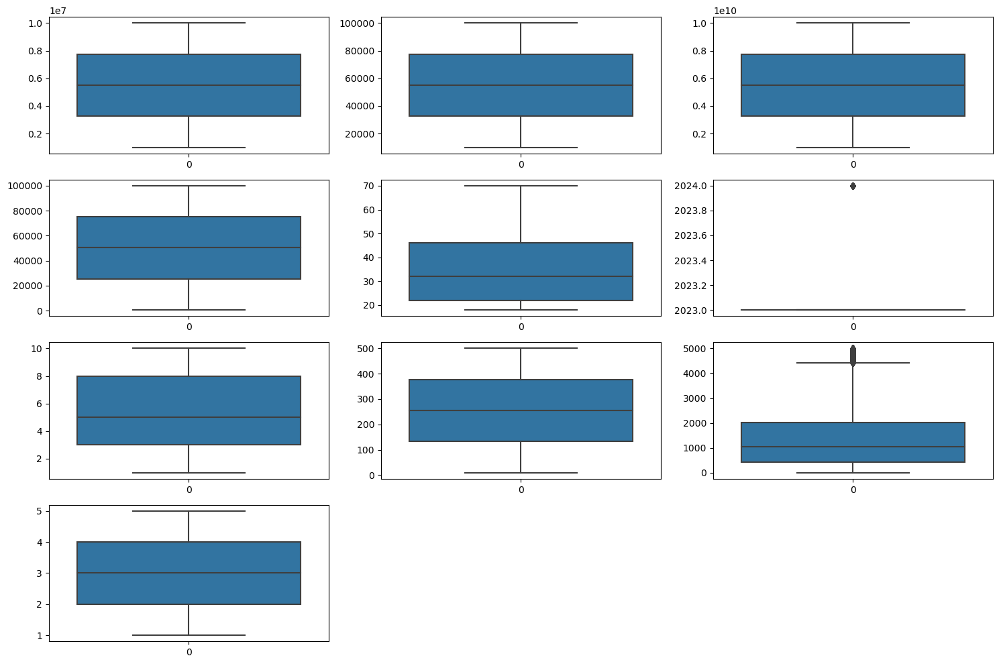

In [31]:
plt.figure(figsize=(15,10))
t = 1
for i in num:
  plt.subplot(4,3,t)
  sns.boxplot(df[i])
  t+=1
plt.tight_layout()
plt.show()

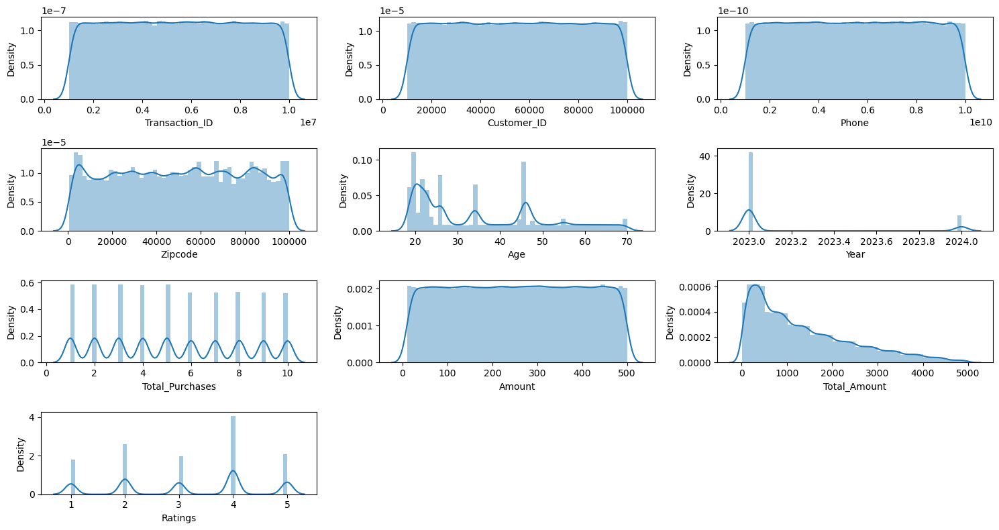

In [32]:
plt.figure(figsize=(15,8))
t = 1
for i in num:
  plt.subplot(4,3,t)
  sns.distplot(df[i])
  t+=1
plt.tight_layout()
plt.show()

In [33]:
for i in num:
  print(f'The skew value of column {i} is {df[i].skew()}')

The skew value of column Transaction_ID is 0.001639501388212643
The skew value of column Customer_ID is 0.0006236504790154673
The skew value of column Phone is -0.0014123314401128513
The skew value of column Zipcode is -0.010906808195227264
The skew value of column Age is 0.6525405490824616
The skew value of column Year is 1.803934292694037
The skew value of column Total_Purchases is 0.07223497340412534
The skew value of column Amount is -0.0022333861517007387
The skew value of column Total_Amount is 0.9728525301608176
The skew value of column Ratings is -0.2416294521151826


In [34]:
pd.reset_option('display.max_rows')

In [35]:
for i in cat:
  print(df[i].value_counts())
  print()
  print('-------------------------------------------------------')

Name
Michael Smith        144
Michael Johnson      111
Michael Jones        102
Christopher Smith     93
Michael Williams      91
                    ... 
Tina Black             1
Alan Jackson           1
Kenneth Cochran        1
Megan Frey             1
Kayla Stanley          1
Name: count, Length: 159390, dtype: int64

-------------------------------------------------------
Email
Michael59@gmail.com     93
Michael95@gmail.com     92
Michael17@gmail.com     90
Michael39@gmail.com     87
Michael50@gmail.com     84
                        ..
Gabriela89@gmail.com     1
Mike93@gmail.com         1
Cassie26@gmail.com       1
Ralph97@gmail.com        1
Madeline91@gmail.com     1
Name: count, Length: 52897, dtype: int64

-------------------------------------------------------
Address
956 Garcia Squares Apt. 632         2
100 White Isle                      2
80302 Andrew Ranch Suite 353        2
99089 Carpenter Port                2
9358 Turner Cove Apt. 008           2
                      

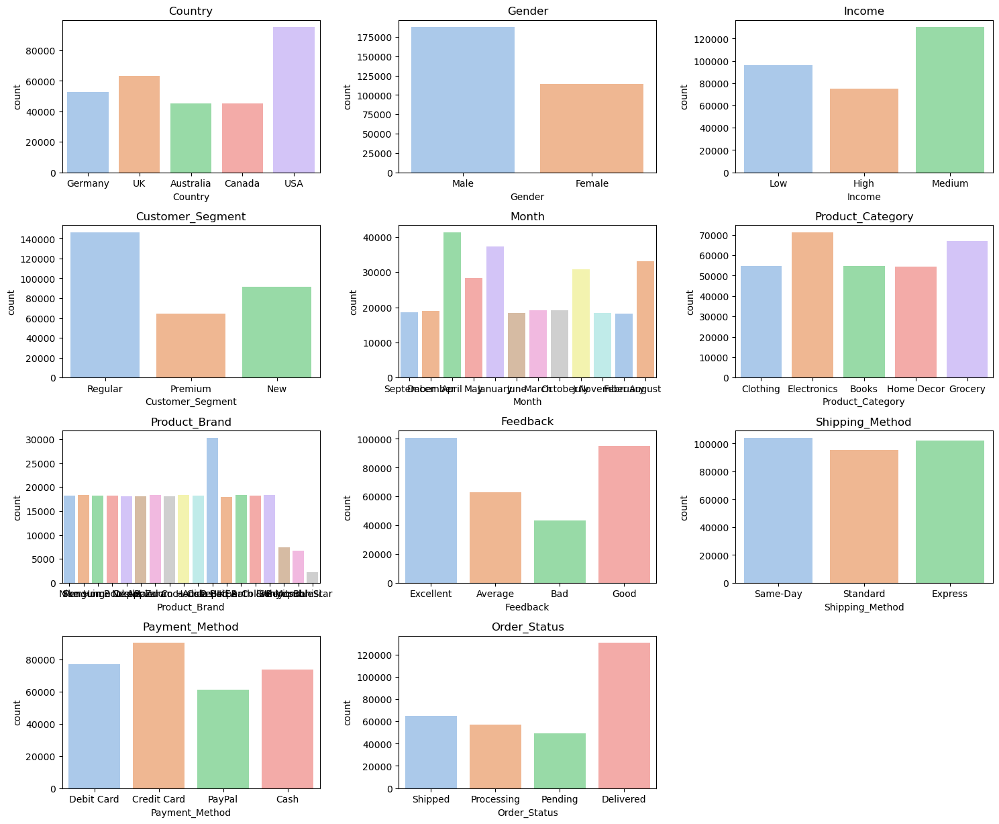

In [36]:
plt.figure(figsize=(15,15))
t = 1
for i in ['Country', 'Gender','Income', 'Customer_Segment','Month','Product_Category', 'Product_Brand', 'Feedback','Shipping_Method', 'Payment_Method', 'Order_Status']:
  plt.subplot(5,3,t)
  sns.countplot(data=df,x=i,palette='pastel')
  plt.title(i)
  t+=1
plt.tight_layout()
plt.show()

In [37]:
cat

['Name',
 'Email',
 'Address',
 'City',
 'State',
 'Country',
 'Gender',
 'Income',
 'Customer_Segment',
 'Date',
 'Month',
 'Time',
 'Product_Category',
 'Product_Brand',
 'Product_Type',
 'Feedback',
 'Shipping_Method',
 'Payment_Method',
 'Order_Status',
 'products']

In [38]:
num

['Transaction_ID',
 'Customer_ID',
 'Phone',
 'Zipcode',
 'Age',
 'Year',
 'Total_Purchases',
 'Amount',
 'Total_Amount',
 'Ratings']

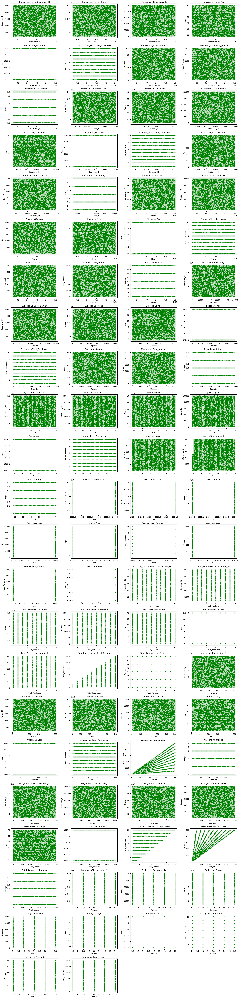

In [39]:
plt.figure(figsize=(20,90))
t = 1
for i in num:
  for j in num:
    if i != j:
      plt.subplot(25,4,t)
      sns.scatterplot(x=df[i],y=df[j],color='green')
      plt.title(f'{i} vs {j}')
      t+=1
plt.tight_layout()
plt.show()

<Figure size 2000x9000 with 0 Axes>

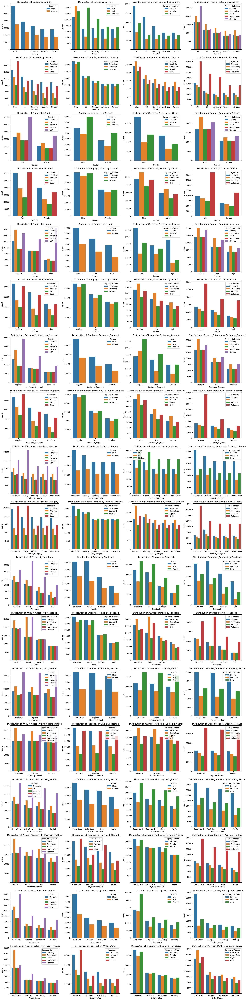

In [40]:
plt.figure(figsize=(20,90))
cat_lst = ['Country', 'Gender','Income', 'Customer_Segment','Product_Category', 'Feedback','Shipping_Method', 'Payment_Method', 'Order_Status']
t = 1
plt.figure(figsize=(20, 90))

for i in cat_lst:
    for j in cat_lst:
        if j != i:
            plt.subplot(20, 4, t)

            # Count occurrences and sort them
            count_data = df[i].value_counts()
            sorted_categories = count_data.index

            # Plot with sorted categories
            sns.countplot(x=df[i], hue=df[j], order=sorted_categories)
            plt.title(f'Distribution of {j} by {i}')
            t += 1

plt.tight_layout()
plt.show()

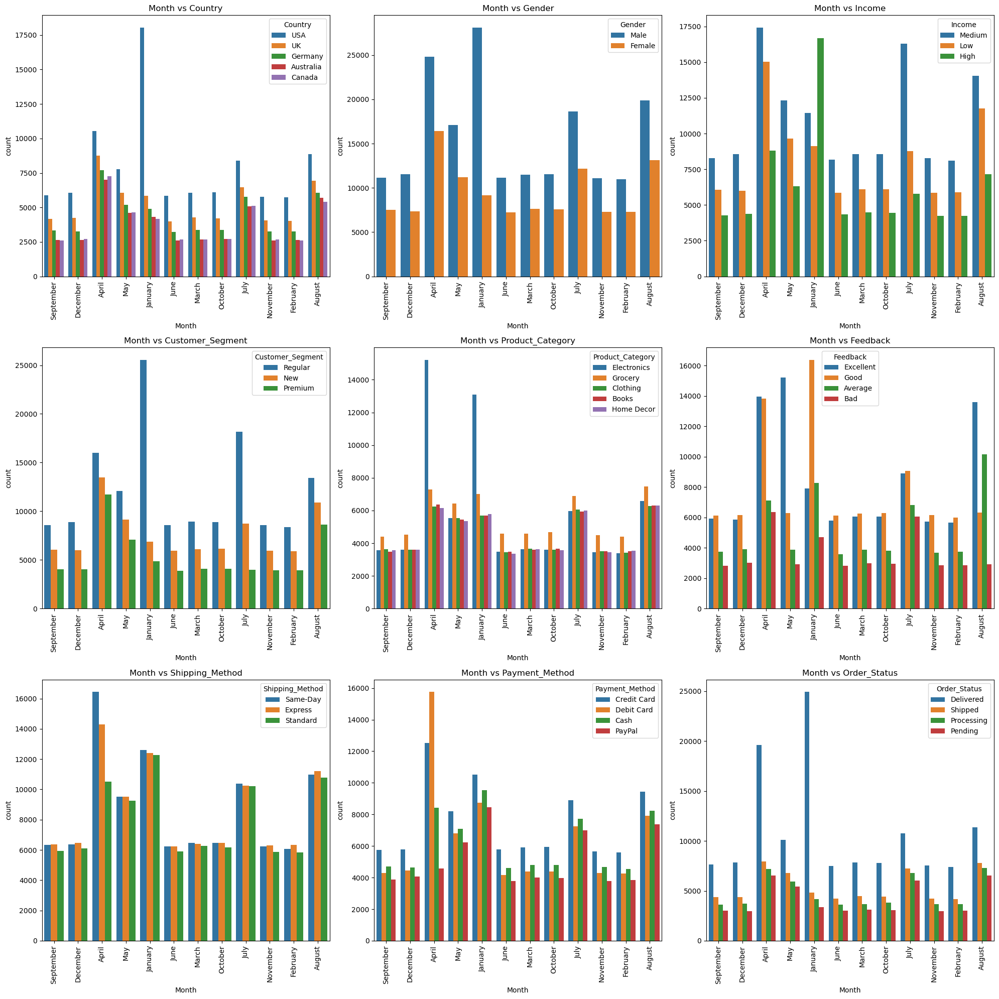

In [41]:
cat_lst = ['Country', 'Gender', 'Income', 'Customer_Segment', 'Product_Category', 'Feedback', 'Shipping_Method', 'Payment_Method', 'Order_Status']
t = 1

plt.figure(figsize=(20, 20))

for i in cat_lst:
    plt.subplot(3, 3, t)

    # Count occurrences of categories in column `i`
    count_data = df[i].value_counts()
    sorted_categories = count_data.index

    # Create the countplot with sorted hue order
    sns.countplot(x=df['Month'], hue=df[i], hue_order=sorted_categories)
    plt.title(f'Month vs {i}')
    plt.xticks(rotation=90)
    t += 1

plt.tight_layout()
plt.show()

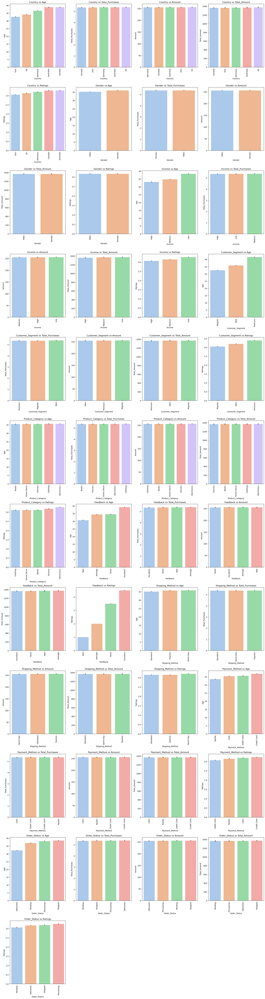

In [42]:
cat_lst = ['Country', 'Gender', 'Income', 'Customer_Segment', 'Product_Category', 'Feedback', 'Shipping_Method', 'Payment_Method', 'Order_Status']
num_lst = ['Age', 'Total_Purchases', 'Amount', 'Total_Amount', 'Ratings']
t = 1

plt.figure(figsize=(20, 75))

for i in cat_lst:
    for j in num_lst:
        plt.subplot(12, 4, t)

        # Aggregate data
        aggregated_data = df.groupby(i)[j].mean().sort_values()
        sorted_categories = aggregated_data.index

        # Create the barplot with sorted categories
        sns.barplot(x=df[i].astype(pd.CategoricalDtype(categories=sorted_categories, ordered=True)), y=df[j], order=sorted_categories,palette='pastel')
        plt.title(f'{i} vs {j}')
        plt.xticks(rotation=90)
        t += 1

plt.tight_layout()
plt.show()

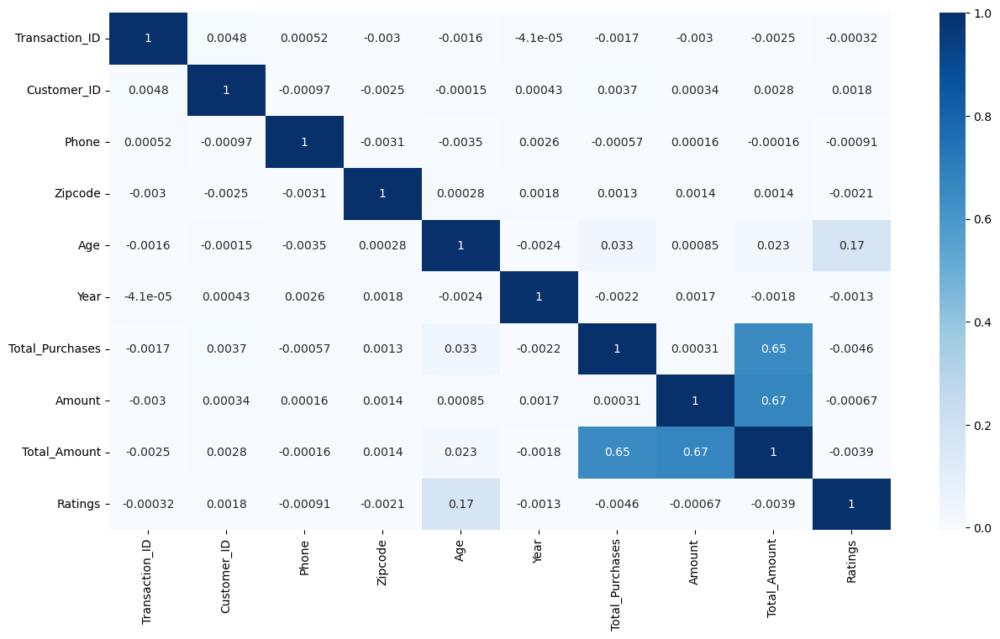

In [43]:
plt.figure(figsize=(15,8))
sns.heatmap(df[num].corr(), annot=True, cmap='Blues')
plt.show()

In [44]:
df.duplicated().sum()

0

In [45]:
df.drop_duplicates(inplace=True)

In [46]:
df.duplicated().sum()

0

In [47]:
df.isna().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                 173
Gender              317
Income              290
Customer_Segment    215
Date                359
Year                350
Month               273
Time                350
Total_Purchases     361
Amount              356
Total_Amount        350
Product_Category    283
Product_Brand       281
Product_Type          0
Feedback            184
Shipping_Method     337
Payment_Method      297
Order_Status        235
Ratings             184
products              0
dtype: int64

In [48]:
(df.isna().sum()/len(df))*100

Transaction_ID      0.110263
Customer_ID         0.101985
Name                0.126488
Email               0.114898
Phone               0.119865
Address             0.104303
City                0.082118
State               0.093045
Zipcode             0.112581
Country             0.089733
Age                 0.057284
Gender              0.104965
Income              0.096025
Customer_Segment    0.071191
Date                0.118872
Year                0.115892
Month               0.090396
Time                0.115892
Total_Purchases     0.119534
Amount              0.117878
Total_Amount        0.115892
Product_Category    0.093707
Product_Brand       0.093045
Product_Type        0.000000
Feedback            0.060926
Shipping_Method     0.111587
Payment_Method      0.098342
Order_Status        0.077813
Ratings             0.060926
products            0.000000
dtype: float64

In [49]:
df[df[['Total_Purchases','Amount','Total_Amount']].isna().any(axis=1)]

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
174,8744927.0,39728.0,Derek Perez,Brandon75@gmail.com,2.175019e+09,54835 Jon Viaduct Suite 484,Portsmouth,England,527.0,UK,50.0,Male,High,Regular,7/23/2023,2023.0,July,20:46:04,NaN,417.034001,1251.102005,Grocery,Pepsi,Water,Average,Standard,Credit Card,Pending,2.0,Sparkling water
582,6188453.0,92425.0,Jack Castillo,Kathy72@gmail.com,9.436773e+09,787 Bailey Roads,Portsmouth,England,9654.0,UK,48.0,Male,High,Regular,11/29/2023,2023.0,November,7:59:04,4.0,472.630596,NaN,Electronics,Sony,Television,Good,Same-Day,PayPal,Shipped,4.0,Plasma TV
966,1153740.0,13769.0,Susan Johnson,Kayla21@gmail.com,5.468841e+09,9308 Watts Plains Apt. 587,Portsmouth,England,833.0,UK,21.0,Female,High,Regular,3/7/2023,2023.0,March,10:24:29,6.0,487.032604,NaN,Clothing,Adidas,Jacket,Average,Standard,PayPal,Pending,2.0,Blazer
1039,9168609.0,45787.0,Shannon Henry,Thomas91@gmail.com,7.160260e+09,33526 Darrell Tunnel Suite 098,Portsmouth,England,89302.0,UK,21.0,Male,High,Regular,7/25/2023,2023.0,July,18:19:34,5.0,386.200769,NaN,Books,Penguin Books,Non-Fiction,Excellent,Express,Cash,Pending,4.0,Science
1116,1510109.0,67589.0,Dr. Brian Williams,Stacy13@gmail.com,9.818707e+09,42414 Garcia Spurs Apt. 849,Portsmouth,England,69240.0,UK,21.0,Male,High,Regular,5/27/2023,2023.0,May,21:54:07,7.0,NaN,1991.244975,Grocery,Pepsi,Juice,Good,Same-Day,Credit Card,Delivered,3.0,Cranberry juice
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
300706,6999695.0,67103.0,Eric Richardson,Debbie36@gmail.com,2.889833e+09,9609 Tammy Stream,Stuttgart,Berlin,63290.0,Germany,34.0,Male,Low,Regular,3/6/2023,2023.0,March,19:54:48,5.0,NaN,1052.350447,Home Decor,Home Depot,Furniture,Excellent,Standard,Cash,Delivered,4.0,Sofa
300983,4168644.0,83878.0,Darryl Martin,Brian43@gmail.com,5.251001e+09,498 Beth Forges,Bremen,Berlin,20925.0,Germany,49.0,Male,High,Premium,6/23/2023,2023.0,June,2:31:48,NaN,473.548980,4261.940820,Home Decor,Home Depot,Tools,Excellent,Express,Cash,Shipped,5.0,Drill
301231,5664242.0,91682.0,Ryan Stevens,Anna55@gmail.com,7.234184e+09,055 Walsh Forks,Perth,New South Wales,14105.0,Australia,67.0,Male,Low,Premium,8/10/2023,2023.0,August,14:28:18,9.0,NaN,3282.923155,Grocery,Nestle,Coffee,Good,Standard,Cash,Processing,4.0,Coffee beans
301466,2045174.0,53588.0,Dr. Margaret Garcia,Valerie47@gmail.com,1.551219e+09,9032 Angela Loaf,Kelowna,Ontario,60856.0,Canada,19.0,Male,Medium,Regular,6/2/2023,2023.0,June,18:28:43,5.0,167.486837,NaN,Home Decor,IKEA,Lighting,Good,Standard,Cash,Processing,4.0,Pendant lights


In [50]:
def fill_missing_values(item):
    if pd.isnull(item['Total_Purchases']):
        item['Total_Purchases'] = round(item['Total_Amount'] / item['Amount'], 1)

    if pd.isnull(item['Total_Amount']):
        item['Total_Amount'] = item['Amount'] * item['Total_Purchases']

    if pd.isnull(item['Amount']):
        item['Amount'] = item['Total_Amount'] / item['Total_Purchases']

    return pd.Series([item['Total_Purchases'], item['Total_Amount'], item['Amount']],
                     index=['Total_Purchases', 'Total_Amount', 'Amount'])

df[['Total_Purchases', 'Total_Amount', 'Amount']] = df.swifter.apply(fill_missing_values, axis=1)

Pandas Apply:   0%|          | 0/302006 [00:00<?, ?it/s]

In [51]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                 173
Gender              317
Income              290
Customer_Segment    215
Date                359
Year                350
Month               273
Time                350
Total_Purchases       0
Amount                1
Total_Amount          1
Product_Category    283
Product_Brand       281
Product_Type          0
Feedback            184
Shipping_Method     337
Payment_Method      297
Order_Status        235
Ratings             184
products              0
dtype: int64

In [52]:
df[df[['Amount','Total_Amount']].isna().any(axis=1)]

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
265310,4138886.0,63270.0,Christopher Walsh,Kevin77@gmail.com,8.220204e+09,92666 Shawn Key,Mackay,New South Wales,30772.0,Australia,31.0,Male,Low,Regular,10/20/2023,2023.0,April,10:12:00,9.0,NaN,NaN,Electronics,Mitsubhisi,Mitsubishi 1.5 Ton 3 Star Split AC,Excellent,Same-Day,Credit Card,Delivered,4.0,Cassette AC


In [53]:
df[(df['Product_Type'] =='Mitsubishi 1.5 Ton 3 Star Split AC')&(df['City']=='Mackay')].loc[:,'Amount'].dropna()

263000    360.392206
263011    439.013244
263157    116.497291
263179     72.915336
263247     90.106459
             ...    
269175     57.886527
269375    210.685084
269394    288.625823
269430    238.928004
269642     11.493291
Name: Amount, Length: 65, dtype: float64

In [54]:
amt= np.median(df[(df['Product_Type'] =='Mitsubishi 1.5 Ton 3 Star Split AC')&(df['City']=='Mackay')].loc[:,'Amount'].dropna())
amt

286.1200861

In [55]:
df['Amount'].fillna(amt,inplace=True)

In [56]:
df[df[['Amount','Total_Amount']].isna().any(axis=1)]

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
265310,4138886.0,63270.0,Christopher Walsh,Kevin77@gmail.com,8.220204e+09,92666 Shawn Key,Mackay,New South Wales,30772.0,Australia,31.0,Male,Low,Regular,10/20/2023,2023.0,April,10:12:00,9.0,286.120086,NaN,Electronics,Mitsubhisi,Mitsubishi 1.5 Ton 3 Star Split AC,Excellent,Same-Day,Credit Card,Delivered,4.0,Cassette AC


In [57]:
df['Total_Amount'].fillna((df.loc[265310,'Amount']*df.loc[265310,'Total_Purchases']),inplace=True)

In [58]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                 173
Gender              317
Income              290
Customer_Segment    215
Date                359
Year                350
Month               273
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category    283
Product_Brand       281
Product_Type          0
Feedback            184
Shipping_Method     337
Payment_Method      297
Order_Status        235
Ratings             184
products              0
dtype: int64

In [59]:
df['Product_Category'].unique()

array(['Clothing', 'Electronics', 'Books', 'Home Decor', 'Grocery', nan],
      dtype=object)

In [60]:
df['Product_Brand'].unique()

array(['Nike', 'Samsung', 'Penguin Books', 'Home Depot', 'Nestle',
       'Apple', 'Zara', 'Random House', 'Coca-Cola', 'Adidas', 'Pepsi',
       'IKEA', 'HarperCollins', 'Bed Bath & Beyond', 'Sony', nan,
       'Whirepool', 'Mitsubhisi', 'BlueStar'], dtype=object)

In [61]:
df[df[['Product_Category','Product_Brand']].isnull().any(axis=1)]

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
262,9596556.0,36083.0,Fred Whitaker,Scott44@gmail.com,3.207951e+09,658 Louis Courts Apt. 000,Portsmouth,England,72704.0,UK,69.0,Female,Medium,Regular,3/16/2023,2023.0,March,13:26:29,7.0,222.913114,1560.391794,NaN,Nestle,Chocolate,Excellent,Standard,Debit Card,Shipped,5.0,White chocolate
437,4138830.0,17705.0,Michelle Simmons,Peter4@gmail.com,3.235196e+09,91972 Randolph Locks,Portsmouth,England,98403.0,UK,62.0,Male,Low,Regular,7/14/2023,2023.0,July,18:24:33,5.0,64.802433,324.012164,NaN,HarperCollins,Non-Fiction,Excellent,Same-Day,Cash,Pending,5.0,Self-help
1337,4461752.0,85987.0,Ashley Mcpherson,Jerry43@gmail.com,6.719592e+09,13277 Carr Mount Apt. 544,Portsmouth,England,38806.0,UK,21.0,Male,High,Regular,10/29/2023,2023.0,October,21:37:19,8.0,303.073420,2424.587363,Home Decor,NaN,Furniture,Average,Standard,Credit Card,Shipped,2.0,Bookshelf
1639,8544160.0,39705.0,Chad Murray,Larry62@gmail.com,5.845634e+09,2739 Rowe Flat,Portsmouth,England,74670.0,UK,21.0,Male,High,Regular,3/27/2023,2023.0,March,9:23:38,3.0,226.663091,679.989273,Books,NaN,Non-Fiction,Excellent,Standard,Cash,Pending,5.0,Psychology
2811,5465214.0,94081.0,Luis Torres,Jeremy33@gmail.com,8.840800e+09,8939 Gordon Cove,Portsmouth,England,75676.0,UK,21.0,Male,Medium,Regular,11/26/2023,2023.0,November,3:31:16,5.0,187.027471,935.137355,Home Decor,NaN,Bathroom,Good,Standard,Debit Card,Delivered,4.0,Toilet paper holder
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
300476,9438539.0,76514.0,Susan Espinoza,Maria51@gmail.com,6.605884e+09,3835 Serrano Lock,Birmingham,England,12960.0,UK,33.0,Male,High,Premium,5/10/2023,2023.0,May,2:47:20,10.0,439.322166,4393.221664,Clothing,NaN,Shoes,Average,Same-Day,Credit Card,Pending,2.0,High heels
300569,5980235.0,73071.0,Penny Calhoun,Timothy64@gmail.com,1.035816e+09,39236 Alvin Ranch Suite 071,San Francisco,Oklahoma,73012.0,USA,62.0,Female,High,Premium,6/28/2023,2023.0,June,3:45:54,7.0,336.434192,2355.039342,Books,NaN,Non-Fiction,Good,Standard,Credit Card,Processing,4.0,Cooking
300585,6077933.0,77745.0,Rachel Maynard,Kenneth90@gmail.com,2.682414e+09,17778 Castillo Stream,Bonn,Berlin,71735.0,Germany,25.0,Male,Medium,Regular,11/7/2023,2023.0,November,19:12:08,8.0,113.040141,904.321131,NaN,Adidas,Jacket,Bad,Same-Day,Debit Card,Processing,1.0,Blazer
301192,7081282.0,55340.0,Michele Clay,Brian13@gmail.com,1.495904e+09,31513 Bailey Fords,Albury-Wodonga,New South Wales,77806.0,Australia,38.0,Female,Low,New,6/18/2023,2023.0,June,4:11:22,1.0,13.649944,13.649944,NaN,Random House,Non-Fiction,Bad,Same-Day,Cash,Delivered,1.0,Science


In [62]:
def fill_missing_prod(item):
    if pd.isnull(item['Product_Category']):
        item['Product_Category'] = df[(df['Product_Brand'] == item['Product_Brand']) & (df['products'] == item['products']) & (df['Product_Type'] == item['Product_Type'])]['Product_Category'].mode()[0]

    if pd.isnull(item['Product_Brand']):
        item['Product_Brand'] = df[(df['Product_Category'] == item['Product_Category']) & (df['products'] == item['products']) & (df['Product_Type'] == item['Product_Type'])]['Product_Brand'].mode()[0]

    return pd.Series([item['Product_Category'], item['Product_Brand']],
                     index=['Product_Category', 'Product_Brand'])

df[['Product_Category','Product_Brand']] = df.swifter.apply(fill_missing_prod, axis=1)

Pandas Apply:   0%|          | 0/302006 [00:00<?, ?it/s]

In [63]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                 173
Gender              317
Income              290
Customer_Segment    215
Date                359
Year                350
Month               273
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback            184
Shipping_Method     337
Payment_Method      297
Order_Status        235
Ratings             184
products              0
dtype: int64

In [64]:
df[(df['Product_Brand'] == 'Nestle') & (df['products'] == 'White chocolate') & (df['Product_Type'] == 'Chocolate')]['Product_Category'].mode()[0]

'Grocery'

In [65]:
df[(df['Product_Category'] == 'Home Decor') & (df['products'] == 'Bookshelf') & (df['Product_Type'] == 'Furniture')]['Product_Brand'].mode()[0]

'IKEA'

In [66]:
df[(df['Product_Category'] == 'Home Decor') & (df['products'] == 'Bookshelf') & (df['Product_Type'] == 'Furniture')]['Product_Brand'].value_counts()

Product_Brand
IKEA          627
Home Depot    584
Name: count, dtype: int64

In [67]:
df['Age'].skew()

0.6525405490824616

In [68]:
np.median(df['Age'])

nan

In [69]:
age_median= np.nanmedian(df['Age'])
age_median

32.0

In [70]:
df['Age'].fillna(age_median,inplace=True)

In [71]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                   0
Gender              317
Income              290
Customer_Segment    215
Date                359
Year                350
Month               273
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback            184
Shipping_Method     337
Payment_Method      297
Order_Status        235
Ratings             184
products              0
dtype: int64

In [72]:
df[df[['Name','Gender']].isnull().all(axis=1)]

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products


In [73]:
df[df[['Name','Gender']].isnull().any(axis=1)]

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
389,7637365.0,23631.0,Rita Ruiz MD,Elizabeth9@gmail.com,7.884475e+09,592 Jacob Groves Suite 528,Portsmouth,England,86955.0,UK,48.0,NaN,Medium,Regular,2/29/2024,2024.0,February,3:41:21,9.0,159.507104,1435.563936,Electronics,Apple,Smartphone,Excellent,Standard,Cash,Shipped,5.0,iPhone
1866,4013900.0,66992.0,Carolyn Little,Alicia76@gmail.com,6.234076e+09,857 Nicholas Ranch Suite 454,Portsmouth,England,59702.0,UK,21.0,NaN,High,Regular,7/16/2023,2023.0,July,10:06:48,10.0,16.462524,164.625237,Home Decor,IKEA,Lighting,Average,Express,PayPal,Pending,2.0,Chandeliers
3140,2575977.0,65490.0,Scott Garrison,Janice88@gmail.com,4.155288e+09,8733 Smith Rue Suite 732,Portsmouth,England,21271.0,UK,21.0,NaN,Medium,Regular,10/30/2023,2023.0,October,16:56:02,5.0,409.067452,2045.337257,Clothing,Zara,Jeans,Good,Standard,Credit Card,Pending,3.0,Low-rise jeans
3449,3123103.0,45940.0,NaN,Natalie62@gmail.com,7.059169e+09,257 Nicholas Roads Apt. 801,Portsmouth,England,81481.0,UK,21.0,Male,Medium,Regular,2/13/2024,2024.0,February,2:01:32,3.0,311.643827,934.931481,Electronics,Apple,Tablet,Bad,Express,Credit Card,Delivered,1.0,Asus ZenPad
3577,9396347.0,24702.0,NaN,Ashley53@gmail.com,3.172745e+09,37738 Andrew Lane,Portsmouth,England,85759.0,UK,21.0,Female,Medium,Regular,7/29/2023,2023.0,July,2:20:16,5.0,301.995126,1509.975630,Electronics,Apple,Laptop,Bad,Express,Cash,Pending,1.0,Acer Swift
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299077,3756844.0,12665.0,NaN,Caitlin60@gmail.com,8.621592e+09,67005 Robert Row,Bonn,Berlin,44222.0,Germany,59.0,Male,High,Premium,10/19/2023,2023.0,October,7:44:13,8.0,26.139412,209.115293,Electronics,Apple,Tablet,Average,Express,Credit Card,Delivered,2.0,Samsung Galaxy Tab
300086,8783677.0,15463.0,Jennifer Cox,Robert20@gmail.com,6.655733e+09,85266 Jacqueline Point Apt. 278,Leicester,England,79267.0,UK,65.0,NaN,Medium,New,1/10/2024,2024.0,January,3:43:11,6.0,440.537653,2643.225916,Home Decor,Bed Bath & Beyond,Bathroom,Excellent,Same-Day,Credit Card,Processing,4.0,Sink
300738,8721462.0,26989.0,NaN,Jason75@gmail.com,7.610317e+09,5088 William Ports Apt. 733,Tucson,Arkansas,71985.0,USA,31.0,Male,Medium,Regular,7/31/2023,2023.0,July,22:44:26,4.0,13.421473,53.685893,Electronics,Samsung,Television,Excellent,Same-Day,Cash,Pending,4.0,HDR TV
300800,9059361.0,45085.0,NaN,Thomas89@gmail.com,1.265885e+09,4304 Smith Mission,Duisburg,Berlin,59573.0,Germany,26.0,Male,Low,Regular,9/17/2023,2023.0,September,7:46:43,1.0,312.419783,312.419783,Home Decor,IKEA,Furniture,Excellent,Standard,Cash,Delivered,4.0,Sofa


In [74]:
gd = gender.Detector()
gd.get_gender('Alex')

'male'

In [75]:
df['First_name']= df['Name'].str.split(expand=True)[0]

In [76]:
# Function to predict gender based on the first name or title
def get_gender_from_name(row):
    first_name = row['First_name']

    # If name is null and gender is known, retain the existing gender
    if pd.isnull(first_name) and pd.notnull(row['Gender']):
        return row['Gender']

    # If both name and gender are known, retain the existing gender
    if pd.notnull(first_name) and pd.notnull(row['Gender']):
        return row['Gender']

    # If name is known but gender is unknown, check for titles or predict gender
    if pd.notnull(first_name) and pd.isnull(row['Gender']):
        # Handle title prefixes
        if first_name == 'Mr.':
            return 'male'
        elif first_name == 'Mrs.':
            return 'female'
        elif first_name == 'Dr.':
            return 'unknown'  # Manual imputation needed later

        # If it's not a title, perform gender prediction
        gd = gender.Detector()
        gender_prediction = gd.get_gender(first_name)

        # Handle various outputs from the gender guesser
        if gender_prediction in ['male', 'female']:
            return gender_prediction
        elif gender_prediction in ['mostly_male', 'mostly_female']:
            return gender_prediction.split('_')[1]  # 'male' or 'female'
        else:
            return 'unknown'  # Handle 'unknown', 'andy', or any other case

    # If both name and gender are null, return None
    return None

# Apply the function to fill missing gender values
df['Gender'] = df.swifter.apply(get_gender_from_name, axis=1)


Pandas Apply:   0%|          | 0/302006 [00:00<?, ?it/s]

In [77]:
df.drop(columns='First_name',inplace=True)

In [78]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                   0
Gender                0
Income              290
Customer_Segment    215
Date                359
Year                350
Month               273
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback            184
Shipping_Method     337
Payment_Method      297
Order_Status        235
Ratings             184
products              0
dtype: int64

In [79]:
df.loc[389,'Name']

'Rita Ruiz MD'

In [80]:
df.loc[389,'Gender']

'female'

In [81]:
df['Gender'].value_counts()

Gender
Male       187596
Female     114093
male          158
female        154
unknown         5
Name: count, dtype: int64

In [82]:
df[df['Gender'] == 'unknown']

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
19351,8656139.0,27229.0,Dr. Tracy Taylor,Heather80@gmail.com,1.642790e+09,0678 David Harbor Suite 785,Fort Worth,New Mexico,23078.0,USA,19.0,unknown,Medium,New,9/2/2023,2023.0,September,5:21:13,3.0,148.331018,444.993054,Home Decor,Home Depot,Furniture,Average,Express,Cash,Delivered,2.0,Bed
23955,2502801.0,38773.0,Dr. Chloe Navarro DDS,Jeffrey93@gmail.com,7.425407e+09,2597 Cooley Forge,Frankfurt,Berlin,39192.0,Germany,22.0,unknown,Medium,Regular,3/14/2023,2023.0,March,16:04:21,3.0,304.765262,914.295784,Books,Penguin Books,Fiction,Good,Express,Cash,Delivered,3.0,Thriller
112094,7861156.0,70942.0,Dr. Michelle Jones MD,Maria60@gmail.com,8.710562e+09,79611 Karen Hills,Arlington,New Jersey,7698.0,USA,46.0,unknown,Low,Premium,4/27/2023,2023.0,April,16:52:12,2.0,269.073750,538.147499,Home Decor,Bed Bath & Beyond,Bathroom,Excellent,Express,Debit Card,Processing,4.0,Bathtub
189205,7362577.0,41221.0,Paige Malone,Michelle42@gmail.com,5.011203e+09,9666 Gross Stream Suite 877,Charlotte,Michigan,48773.0,USA,40.0,unknown,High,Regular,11/30/2023,2023.0,November,18:26:46,3.0,241.126598,723.379793,Electronics,Sony,Smartphone,Good,Standard,Cash,Pending,4.0,Huawei P
273224,7890956.0,23603.0,Dr. Patrick Bass,Paul44@gmail.com,7.252906e+09,53956 Gay Corners Suite 585,Hamburg,Berlin,774.0,Germany,27.0,unknown,High,New,1/2/2024,2024.0,April,5:06:48,10.0,409.010381,4090.103811,Clothing,Adidas,Shoes,Excellent,Standard,PayPal,Delivered,5.0,Slippers


In [83]:
gd = gender.Detector()
print(gd.get_gender('Tracy'))
print(gd.get_gender('Chloe'))
print(gd.get_gender('Michelle'))
print(gd.get_gender('Paige'))
print(gd.get_gender('Patrick'))

mostly_female
female
female
andy
male


In [84]:
df.loc[19351,'Gender'] = 'Female'
df.loc[23955,'Gender'] = 'Female'
df.loc[112094,'Gender'] = 'Female'
df.loc[189205,'Gender'] = 'Female'
df.loc[273224,'Gender'] = 'Male'

In [85]:
df['Gender'].value_counts()

Gender
Male      187597
Female    114097
male         158
female       154
Name: count, dtype: int64

In [86]:
df['Gender'].replace(to_replace='male',value='Male',inplace=True)
df['Gender'].replace(to_replace='female',value='Female',inplace=True)

In [87]:
df['Gender'].value_counts()

Gender
Male      187755
Female    114251
Name: count, dtype: int64

In [88]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                   0
Gender                0
Income              290
Customer_Segment    215
Date                359
Year                350
Month               273
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback            184
Shipping_Method     337
Payment_Method      297
Order_Status        235
Ratings             184
products              0
dtype: int64

In [89]:
df['Income'].value_counts()


Income
Medium    130230
Low        96257
High       75229
Name: count, dtype: int64

In [90]:
income_mode= df['Income'].mode()[0]
income_mode

'Medium'

In [91]:
df['Income'].fillna(income_mode,inplace=True)

In [92]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                   0
Gender                0
Income                0
Customer_Segment    215
Date                359
Year                350
Month               273
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback            184
Shipping_Method     337
Payment_Method      297
Order_Status        235
Ratings             184
products              0
dtype: int64

In [93]:
df['Customer_Segment'].value_counts()

Customer_Segment
Regular    146219
New         91185
Premium     64387
Name: count, dtype: int64

In [94]:
df['Customer_Segment'].mode()[0]

'Regular'

In [95]:
#df['Customer_Segment'].fillna(df['Customer_Segment'].mode()[0],inplace=True)

In [96]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                   0
Gender                0
Income                0
Customer_Segment    215
Date                359
Year                350
Month               273
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback            184
Shipping_Method     337
Payment_Method      297
Order_Status        235
Ratings             184
products              0
dtype: int64

In [97]:
df['Shipping_Method'].value_counts()

Shipping_Method
Same-Day    104155
Express     102354
Standard     95160
Name: count, dtype: int64

In [98]:
shipping_mode= df['Shipping_Method'].mode()[0]
shipping_mode

'Same-Day'

In [99]:
df['Shipping_Method'].fillna(shipping_mode,inplace=True)

In [100]:
df['Payment_Method'].value_counts()

Payment_Method
Credit Card    90115
Debit Card     76790
Cash           73807
PayPal         60997
Name: count, dtype: int64

In [101]:
payment_mode= df['Payment_Method'].mode()[0]
payment_mode

'Credit Card'

In [102]:
df['Payment_Method'].fillna(payment_mode,inplace=True)

In [103]:
df['Order_Status'].value_counts()

Order_Status
Delivered     130448
Shipped        65024
Processing     57198
Pending        49101
Name: count, dtype: int64

In [104]:
order_mode= df['Order_Status'].mode()[0]
order_mode

'Delivered'

In [105]:
df['Order_Status'].fillna(order_mode,inplace=True)

In [106]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                   0
Gender                0
Income                0
Customer_Segment    215
Date                359
Year                350
Month               273
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback            184
Shipping_Method       0
Payment_Method        0
Order_Status          0
Ratings             184
products              0
dtype: int64

In [107]:
df[df[['Date','Year','Month']].isnull().all(axis=1)]

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products


In [108]:
df['Extracted_Month']= df['Date'].str.split('/',expand=True)[0]
df['Extracted_Year']= df['Date'].str.split('/',expand=True)[2]

In [109]:
df[df[['Year','Extracted_Year']].isnull().all(axis=1)]

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products,Extracted_Month,Extracted_Year


In [110]:
df[df[['Month','Extracted_Month']].isnull().all(axis=1)]

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,Age,Gender,Income,Customer_Segment,Date,Year,Month,Time,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products,Extracted_Month,Extracted_Year
205382,5090991.0,30625.0,Steven Rhodes,Garrett87@gmail.com,8.793384e+09,47704 Johnson Roads,Calgary,Ontario,93744.0,Canada,65.0,Male,Low,Regular,NaN,2023.0,NaN,8:56:02,2.0,77.245802,154.491603,Electronics,Apple,Laptop,Average,Standard,Credit Card,Processing,2.0,Acer Swift,NaN,NaN


In [111]:
def fill_missing_date(item):
    # Fill in Year if it's missing but Extracted_Year is available
    if pd.isnull(item['Year']) and pd.notnull(item['Extracted_Year']):
        item['Year'] = item['Extracted_Year']

    # Fill in Month if it's missing but Extracted_Month is available
    if pd.isnull(item['Month']) and pd.notnull(item['Extracted_Month']):
        item['Month'] = item['Extracted_Month']

    # Return only the Month and Year columns
    return pd.Series([item['Month'], item['Year']], index=['Month', 'Year'])

# Apply the function to update Month and Year in the DataFrame
df[['Month', 'Year']] = df.swifter.apply(fill_missing_date, axis=1)

Pandas Apply:   0%|          | 0/302006 [00:00<?, ?it/s]

In [112]:
df.drop(columns=['Extracted_Year','Extracted_Month'],inplace=True)

In [113]:
df['Month'].fillna(df['Month'].mode()[0],inplace=True)

In [114]:
month_mapping = {
    '1': 'January',
    '2': 'February',
    '3': 'March',
    '4': 'April',
    '5': 'May',
    '6': 'June',
    '7': 'July',
    '8': 'August',
    '9': 'September',
    '10': 'October',
    '11': 'November',
    '12': 'December'
}

df['Month'] = df['Month'].apply(lambda x: month_mapping[x] if x in month_mapping else x)

In [115]:
df['Month'].value_counts()

Month
April        41318
January      37308
August       33045
July         30906
May          28349
March        19168
October      19155
December     18973
September    18674
November     18432
June         18399
February     18279
Name: count, dtype: int64

In [116]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                   0
Gender                0
Income                0
Customer_Segment    215
Date                359
Year                  0
Month                 0
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback            184
Shipping_Method       0
Payment_Method        0
Order_Status          0
Ratings             184
products              0
dtype: int64

In [117]:
df['Ratings'].value_counts()

Ratings
4.0    98063
2.0    62673
5.0    50153
3.0    47636
1.0    43297
Name: count, dtype: int64

In [118]:
df['Ratings'].fillna(-1,inplace=True)

In [119]:
df['Ratings'].value_counts()

Ratings
 4.0    98063
 2.0    62673
 5.0    50153
 3.0    47636
 1.0    43297
-1.0      184
Name: count, dtype: int64

In [120]:
df['Feedback'].value_counts()

Feedback
Excellent    100754
Good          95098
Average       62673
Bad           43297
Name: count, dtype: int64

In [121]:
df['Feedback'].fillna('Not Specified',inplace=True)

In [122]:
df['Feedback'].value_counts()

Feedback
Excellent        100754
Good              95098
Average           62673
Bad               43297
Not Specified       184
Name: count, dtype: int64

In [123]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                   0
Gender                0
Income                0
Customer_Segment    215
Date                359
Year                  0
Month                 0
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback              0
Shipping_Method       0
Payment_Method        0
Order_Status          0
Ratings               0
products              0
dtype: int64

In [124]:
df['Day']= df['Date'].str.split('/',expand=True)[1]

In [125]:
df['Day'].fillna(df['Day'].mode()[0],inplace=True)

In [126]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                   0
Gender                0
Income                0
Customer_Segment    215
Date                359
Year                  0
Month                 0
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback              0
Shipping_Method       0
Payment_Method        0
Order_Status          0
Ratings               0
products              0
Day                   0
dtype: int64

In [127]:
df['Hour']= df['Time'].str.split(':',expand=True)[0]

In [128]:
df['Hour'].value_counts()

Hour
11    12719
18    12717
9     12683
7     12673
17    12663
20    12661
8     12633
12    12623
10    12622
5     12599
15    12586
19    12586
13    12550
4     12549
21    12547
6     12542
0     12523
3     12511
22    12507
14    12487
1     12433
2     12433
23    12417
16    12392
Name: count, dtype: int64

In [129]:
df['Hour'].fillna(24,inplace=True)

In [130]:
df['Hour'].value_counts()

Hour
11    12719
18    12717
9     12683
7     12673
17    12663
20    12661
8     12633
12    12623
10    12622
5     12599
19    12586
15    12586
13    12550
4     12549
21    12547
6     12542
0     12523
3     12511
22    12507
14    12487
2     12433
1     12433
23    12417
16    12392
24      350
Name: count, dtype: int64

In [131]:
df['Hour']= df['Hour'].astype(dtype='int')

In [132]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                   0
Gender                0
Income                0
Customer_Segment    215
Date                359
Year                  0
Month                 0
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback              0
Shipping_Method       0
Payment_Method        0
Order_Status          0
Ratings               0
products              0
Day                   0
Hour                  0
dtype: int64

In [133]:
df1= df.copy()

In [134]:
def hour_category(x):
    if x>=9 and x <=17:
        return 'Office hours'
    elif x ==24:
        return 'Unspecified'
    else:
        return 'Outside Office hours'

In [135]:
df['Work Hours']= df['Hour'].map(hour_category)

In [136]:
df['Work Hours'].value_counts()

Work Hours
Outside Office hours    188331
Office hours            113325
Unspecified                350
Name: count, dtype: int64

In [137]:
df.isnull().sum()

Transaction_ID      333
Customer_ID         308
Name                382
Email               347
Phone               362
Address             315
City                248
State               281
Zipcode             340
Country             271
Age                   0
Gender                0
Income                0
Customer_Segment    215
Date                359
Year                  0
Month                 0
Time                350
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback              0
Shipping_Method       0
Payment_Method        0
Order_Status          0
Ratings               0
products              0
Day                   0
Hour                  0
Work Hours            0
dtype: int64

In [138]:
pd.set_option('display.max_rows', None)

In [139]:
df.groupby(by=['Country','State','City'])['City'].agg('count')

Country    State            City               
Australia  New South Wales  Adelaide                2216
                            Albury-Wodonga          2266
                            Ballarat                2251
                            Bendigo                 2309
                            Brisbane                2295
                            Cairns                  2238
                            Canberra                2199
                            Darwin                  2295
                            Geelong                 2329
                            Gold Coast              2199
                            Hobart                  2306
                            Launceston              2259
                            Mackay                  2352
                            Melbourne               2122
                            Newcastle               2215
                            Perth                   2305
                            Sydney      

In [140]:
pd.set_option('display.max_rows', 60)

In [141]:
df= df[~df[['Country','State']].isna().any(axis=1)]

In [142]:
df.isnull().sum()

Transaction_ID      332
Customer_ID         307
Name                382
Email               347
Phone               361
Address             315
City                248
State                 0
Zipcode             338
Country               0
Age                   0
Gender                0
Income                0
Customer_Segment    215
Date                357
Year                  0
Month                 0
Time                349
Total_Purchases       0
Amount                0
Total_Amount          0
Product_Category      0
Product_Brand         0
Product_Type          0
Feedback              0
Shipping_Method       0
Payment_Method        0
Order_Status          0
Ratings               0
products              0
Day                   0
Hour                  0
Work Hours            0
dtype: int64

In [143]:
for i in df.columns:
    print(i)

Transaction_ID
Customer_ID
Name
Email
Phone
Address
City
State
Zipcode
Country
Age
Gender
Income
Customer_Segment
Date
Year
Month
Time
Total_Purchases
Amount
Total_Amount
Product_Category
Product_Brand
Product_Type
Feedback
Shipping_Method
Payment_Method
Order_Status
Ratings
products
Day
Hour
Work Hours


In [144]:
df.drop(columns=['Transaction_ID','Customer_ID','Name','Email','Phone','Address','City','Zipcode','Product_Brand','Hour'],inplace=True)

In [145]:
df.drop(columns=['Customer_Segment','Time','Date'],inplace=True)

In [146]:
df.isnull().sum()

State               0
Country             0
Age                 0
Gender              0
Income              0
Year                0
Month               0
Total_Purchases     0
Amount              0
Total_Amount        0
Product_Category    0
Product_Type        0
Feedback            0
Shipping_Method     0
Payment_Method      0
Order_Status        0
Ratings             0
products            0
Day                 0
Work Hours          0
dtype: int64

In [147]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 301455 entries, 0 to 302009
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   State             301455 non-null  object 
 1   Country           301455 non-null  object 
 2   Age               301455 non-null  float64
 3   Gender            301455 non-null  object 
 4   Income            301455 non-null  object 
 5   Year              301455 non-null  object 
 6   Month             301455 non-null  object 
 7   Total_Purchases   301455 non-null  float64
 8   Amount            301455 non-null  float64
 9   Total_Amount      301455 non-null  float64
 10  Product_Category  301455 non-null  object 
 11  Product_Type      301455 non-null  object 
 12  Feedback          301455 non-null  object 
 13  Shipping_Method   301455 non-null  object 
 14  Payment_Method    301455 non-null  object 
 15  Order_Status      301455 non-null  object 
 16  Ratings           301455 

In [148]:
df['Total_Purchases']= df['Total_Purchases'].astype(dtype='int')

In [149]:
df['Ratings']= df['Ratings'].astype(dtype='int')

In [150]:
df['Age']= df['Age'].astype(dtype='int')

In [151]:
df_copy = df.copy()

In [152]:
df_copy['Year'].value_counts()

Year
2023.0    251397
2024.0     49708
2023         301
2024          49
Name: count, dtype: int64

In [153]:
df_copy['Year']= df_copy['Year'].astype(dtype='int')

In [154]:
df_copy['Year'].value_counts()

Year
2023    251698
2024     49757
Name: count, dtype: int64

In [155]:
df_copy['Year']= df_copy['Year'].astype(dtype='object')

In [156]:
df_us= df_copy[df_copy['Country'] == 'USA']
df_us

,State,Country,Age,Gender,Income,Year,Month,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products,Day,Work Hours
17800,Virginia,USA,19,Female,Medium,2023,October,6,241.823076,1450.938458,Home Decor,Furniture,Average,Express,PayPal,Delivered,2,Bed,26,Outside Office hours
17807,Nevada,USA,19,Female,Medium,2024,February,9,93.552348,841.971130,Books,Non-Fiction,Excellent,Standard,PayPal,Delivered,4,Psychology,27,Outside Office hours
17815,Colorado,USA,19,Female,Medium,2023,December,7,494.749655,3463.247584,Clothing,Shoes,Good,Same-Day,Cash,Delivered,3,Sneakers,11,Outside Office hours
17841,Arkansas,USA,19,Male,Medium,2023,December,7,437.822368,3064.756579,Home Decor,Furniture,Excellent,Express,Cash,Delivered,4,Dresser,29,Office hours
17844,Texas,USA,19,Male,Medium,2023,November,8,170.082122,1360.656973,Clothing,Shoes,Good,Standard,Debit Card,Delivered,4,Loafers,4,Office hours
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301987,Minnesota,USA,39,Female,Low,2024,January,5,302.853808,1514.269041,Grocery,Soft Drink,Good,Same-Day,Cash,Delivered,4,Lemon-lime soda,26,Outside Office hours
301989,Florida,USA,42,Female,Medium,2023,June,5,355.563959,1777.819793,Books,Fiction,Average,Express,Cash,Shipped,2,Horror,5,Outside Office hours
301999,Florida,USA,55,Male,High,2023,July,8,51.716857,413.734856,Electronics,Tablet,Excellent,Same-Day,Cash,Shipped,5,iPad,18,Outside Office hours
302004,Missouri,USA,54,Male,High,2023,October,5,472.424060,2362.120301,Clothing,Shorts,Excellent,Standard,Cash,Delivered,4,Chino shorts,14,Office hours


In [157]:
num= df_us.select_dtypes(include=np.number).columns.to_list()
cat= df_us.select_dtypes(exclude=np.number).columns.to_list()

In [158]:
cat

['State',
 'Country',
 'Gender',
 'Income',
 'Year',
 'Month',
 'Product_Category',
 'Product_Type',
 'Feedback',
 'Shipping_Method',
 'Payment_Method',
 'Order_Status',
 'products',
 'Day',
 'Work Hours']

In [159]:
num

['Age', 'Total_Purchases', 'Amount', 'Total_Amount', 'Ratings']

In [160]:
cat= ['State',
 'Gender',
 'Income',
 'Year',
 'Month',
 'Product_Category',
 'Product_Type',
 'Feedback',
 'Shipping_Method',
 'Payment_Method',
 'Order_Status',
 'Day',
 'Work Hours']

In [161]:
num

['Age', 'Total_Purchases', 'Amount', 'Total_Amount', 'Ratings']

In [162]:
for i in ['Age', 'Total_Purchases', 'Amount', 'Total_Amount', 'Ratings']:
    df[i].info()

<class 'pandas.core.series.Series'>
Index: 301455 entries, 0 to 302009
Series name: Age
Non-Null Count   Dtype
--------------   -----
301455 non-null  int32
dtypes: int32(1)
memory usage: 3.4 MB
<class 'pandas.core.series.Series'>
Index: 301455 entries, 0 to 302009
Series name: Total_Purchases
Non-Null Count   Dtype
--------------   -----
301455 non-null  int32
dtypes: int32(1)
memory usage: 3.4 MB
<class 'pandas.core.series.Series'>
Index: 301455 entries, 0 to 302009
Series name: Amount
Non-Null Count   Dtype  
--------------   -----  
301455 non-null  float64
dtypes: float64(1)
memory usage: 4.6 MB
<class 'pandas.core.series.Series'>
Index: 301455 entries, 0 to 302009
Series name: Total_Amount
Non-Null Count   Dtype  
--------------   -----  
301455 non-null  float64
dtypes: float64(1)
memory usage: 4.6 MB
<class 'pandas.core.series.Series'>
Index: 301455 entries, 0 to 302009
Series name: Ratings
Non-Null Count   Dtype
--------------   -----
301455 non-null  int32
dtypes: int32(1)
me

In [163]:
for i in ['Age', 'Total_Purchases', 'Amount', 'Total_Amount', 'Ratings']:
    a=df[i].unique()
    print(i)
    print(a)

Age
[21 19 48 56 22 58 29 46 25 64 31 53 32 43 69 49 61 41 38 59 20 67 50 26
 66 24 54 28 34 65 40 68 36 57 27 35 70 37 30 39 47 18 60 33 62 42 44 51
 63 55 23 52 45]
Total_Purchases
[ 3  2  7  4  1  8 10  9  6  5]
Amount
[108.0287567 403.3539073 354.4775997 ... 193.5494867 415.4162595
 493.6032674]
Total_Amount
[ 324.08627    806.7078147 1063.432799  ...  193.5494867 4154.162595
 2468.016337 ]
Ratings
[ 5  4  2  1  3 -1]


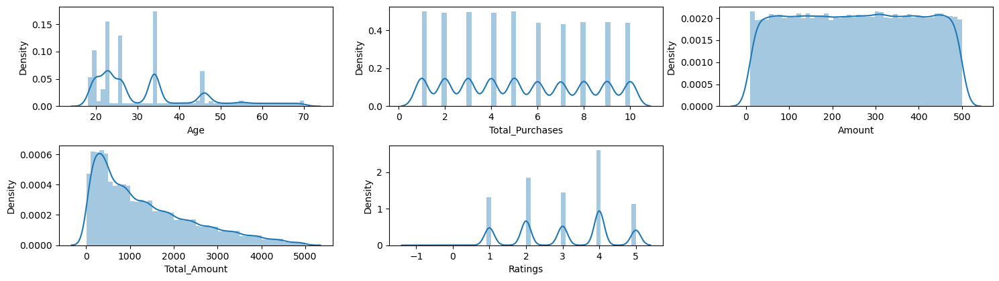

In [164]:
plt.figure(figsize=(15,8))
t = 1
for i in num:
  plt.subplot(4,3,t)
  sns.distplot(df_us[i])
  t+=1
plt.tight_layout()
plt.show()

In [165]:
for i in cat:
  print(df_us[i].value_counts())
  print()
  print('-------------------------------------------------------')

State
Connecticut       21656
Maine             12192
Georgia            9502
Kansas             5516
New Mexico         5198
New York            994
Maryland            979
Pennsylvania        964
Texas               952
California          952
Nevada              949
South Carolina      944
Minnesota           944
Iowa                943
West Virginia       943
Illinois            941
Ohio                939
Mississippi         936
Hawaii              936
Louisiana           928
Utah                924
Michigan            922
Virginia            918
New Jersey          915
Alabama             909
Wyoming             906
Montana             904
South Dakota        904
Delaware            904
Oregon              904
North Carolina      902
Florida             901
Wisconsin           901
Tennessee           901
Nebraska            900
Rhode Island        900
Missouri            898
Kentucky            898
Indiana             897
Arkansas            895
New Hampshire       895
Vermont   

In [166]:
len(cat)

13

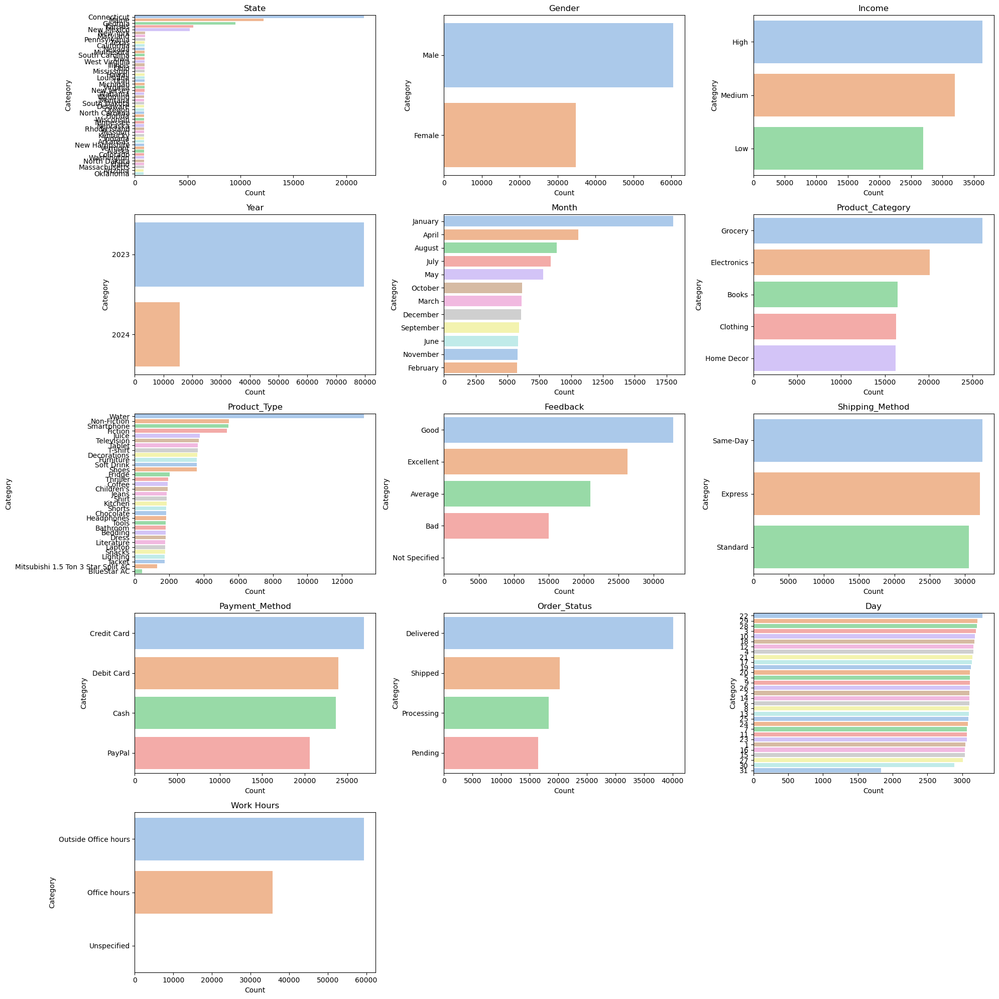

In [167]:
plt.figure(figsize=(20, 20))
t = 1

for i in cat:
    plt.subplot(5, 3, t)

    # Calculate counts and sort them
    count_data = df_us[i].value_counts().sort_values(ascending=False)

    # Create a DataFrame for the sorted counts
    sorted_df = pd.DataFrame({'Category': count_data.index, 'Count': count_data.values})

    # Plot the sorted counts
    sns.barplot(x='Count', y='Category', data=sorted_df, palette='pastel', orient='h')
    plt.title(i)

    t += 1

plt.tight_layout()
plt.show()

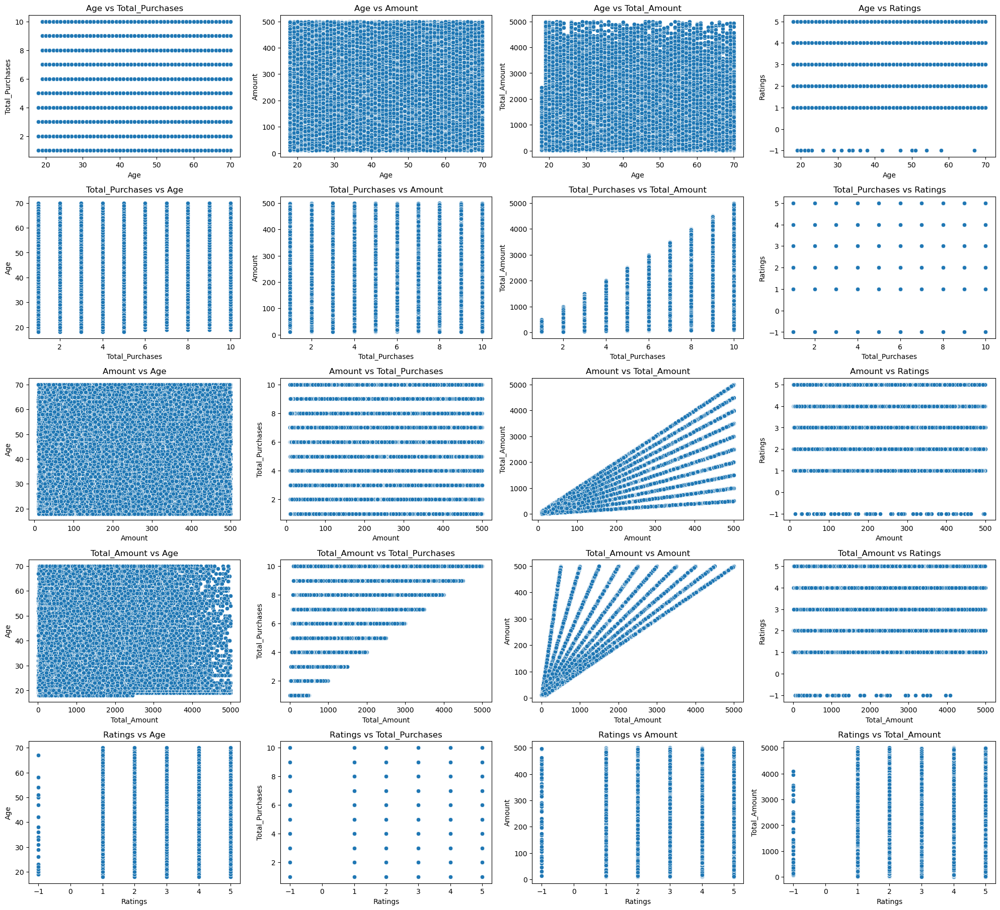

In [168]:
plt.figure(figsize=(20,90))
t = 1
for i in num:
  for j in num:
    if i != j:
      plt.subplot(25,4,t)
      sns.scatterplot(x=df_us[i],y=df_us[j])
      plt.title(f'{i} vs {j}')
      t+=1
plt.tight_layout()
plt.show()

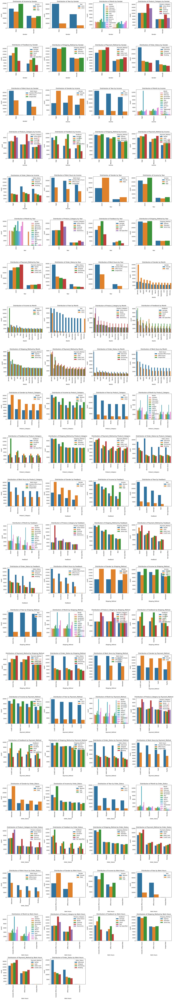

In [169]:
cat = ['Gender', 'Income', 'Year', 'Month', 'Product_Category', 'Feedback', 'Shipping_Method', 'Payment_Method', 'Order_Status','Work Hours']

# Calculate total number of subplots needed
num_plots = len(cat) * (len(cat) - 1)

# Determine the number of rows and columns for the subplot grid
rows = (num_plots + 3) // 4  # Calculate rows needed based on 4 columns
columns = 4

plt.figure(figsize=(20, rows * 5))  # Adjust figure height dynamically based on number of rows

t = 1
for i in cat:
    for j in cat:
        if j != i:
            plt.subplot(rows, columns, t)

            # Calculate frequencies and sort categories for x axis
            count_data = df_us[i].value_counts()
            sorted_categories = count_data.index

            # Create countplot with sorted categories
            sns.countplot(x=df_us[i], hue=df_us[j], order=sorted_categories)
            plt.title(f'Distribution of {j} by {i}')
            plt.xticks(rotation=90)
            t += 1

plt.tight_layout()
plt.show()

In [170]:
cat

['Gender',
 'Income',
 'Year',
 'Month',
 'Product_Category',
 'Feedback',
 'Shipping_Method',
 'Payment_Method',
 'Order_Status',
 'Work Hours']

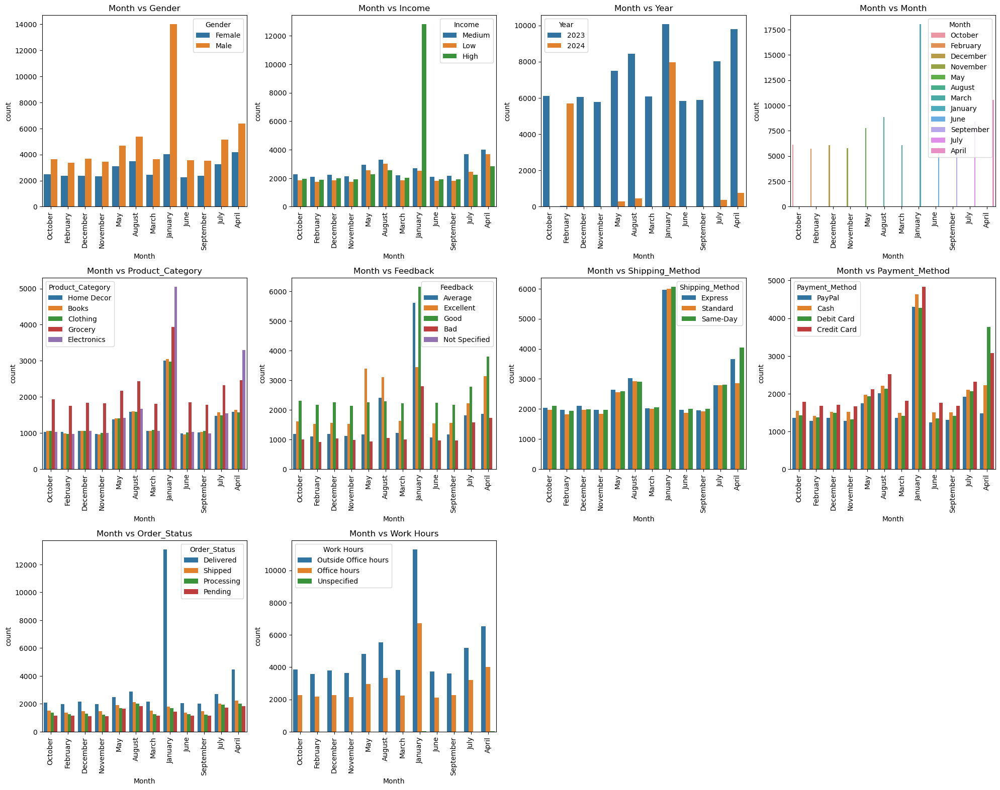

In [171]:
plt.figure(figsize=(20,20))
t = 1
for i in cat:
      plt.subplot(4,4,t)
      sns.countplot(hue=df_us[i], x=df_us['Month'])
      plt.title(f'Month vs {i}')
      plt.xticks(rotation=90)
      t+=1
plt.tight_layout()
plt.show()

In [172]:
len(cat)

10

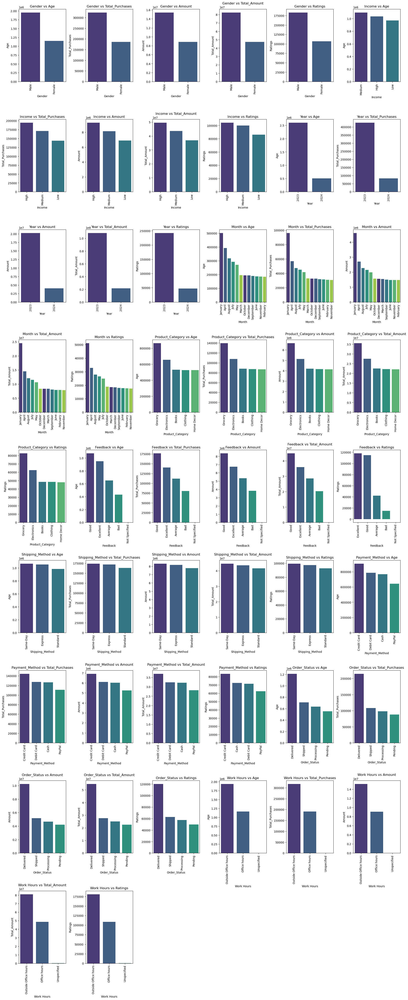

In [173]:
plt.figure(figsize=(20, 75))
t = 1

# Define a predefined color palette
palette = sns.color_palette("viridis")

for i in cat:
    for j in num:
        plt.subplot(14, 6, t)

        # Aggregate data by category and sort
        sorted_df = df_us.groupby(i)[j].sum().sort_values(ascending=False).reset_index()

        # Create barplot with the predefined color palette
        sns.barplot(x=sorted_df[i], y=sorted_df[j], palette=palette)
        plt.title(f'{i} vs {j}')
        plt.xticks(rotation=90)
        t += 1

plt.tight_layout()
plt.show()

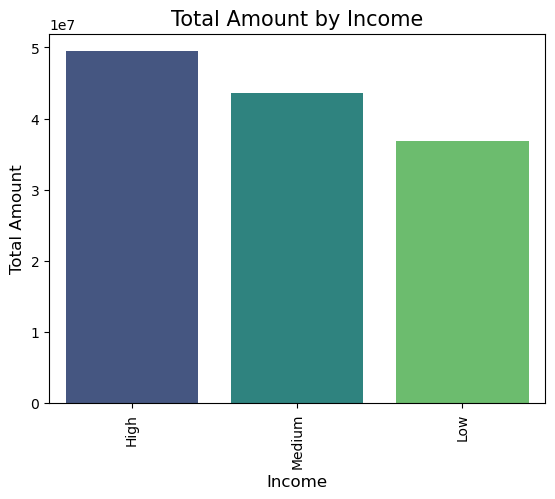

In [174]:
# Aggregate data by 'Income' and sum 'Total_Amount'
sorted_df = df_us.groupby('Income')['Total_Amount'].sum().sort_values(ascending=False).reset_index()

# Create a barplot with the sorted data
sns.barplot(x='Income', y='Total_Amount', data=sorted_df, palette='viridis')

# Set plot title and labels
plt.title('Total Amount by Income', fontsize=15)
plt.xlabel('Income', fontsize=12)
plt.ylabel('Total Amount', fontsize=12)

# Display the plot
plt.xticks(rotation=90)  # Rotate x-axis labels if needed for readability
plt.show()

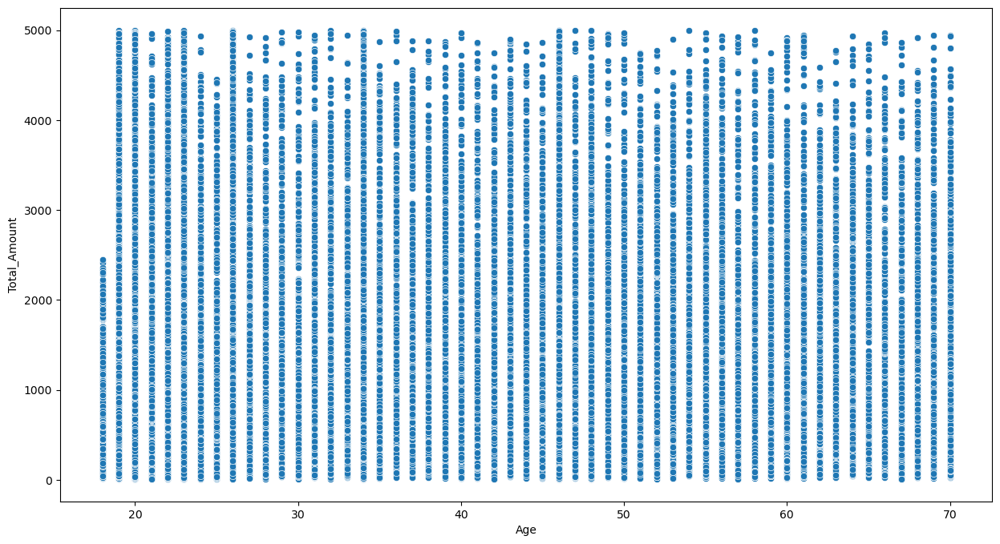

In [175]:
plt.figure(figsize=(15,8))
sns.scatterplot(x=df_us['Age'],y=df_us['Total_Amount'])
plt.show()

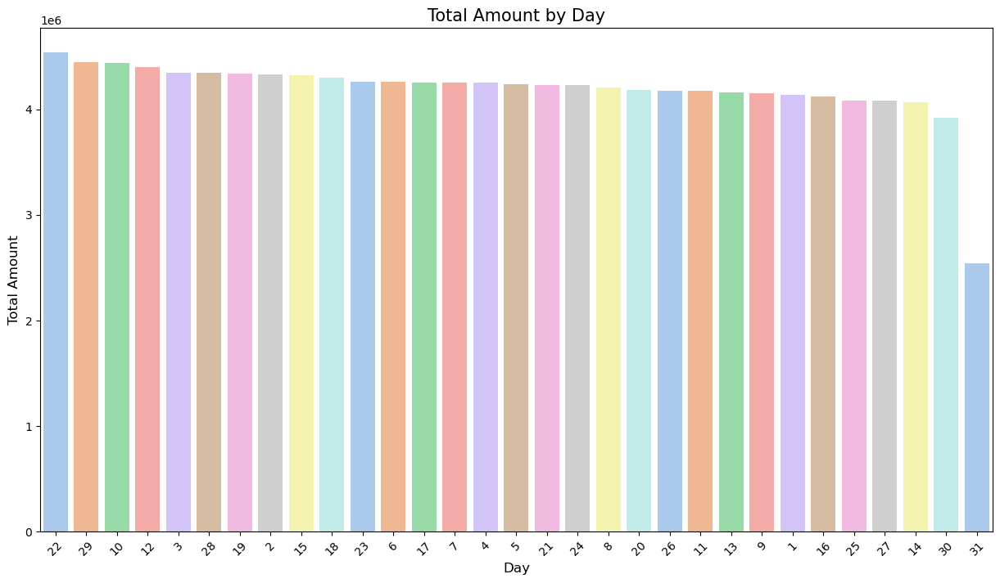

In [176]:
plt.figure(figsize=(15, 8))

# Aggregate data by 'Day' and sum 'Total_Amount'
sorted_df = df_us.groupby('Day')['Total_Amount'].sum().sort_values(ascending=False).reset_index()

# Create a barplot with the sorted data
sns.barplot(x='Day', y='Total_Amount', data=sorted_df, palette='pastel')

# Set plot title and labels
plt.title('Total Amount by Day', fontsize=15)
plt.xlabel('Day', fontsize=12)
plt.ylabel('Total Amount', fontsize=12)

# Rotate x-axis labels if needed for readability
plt.xticks(rotation=45)

# Display the plot
plt.show()

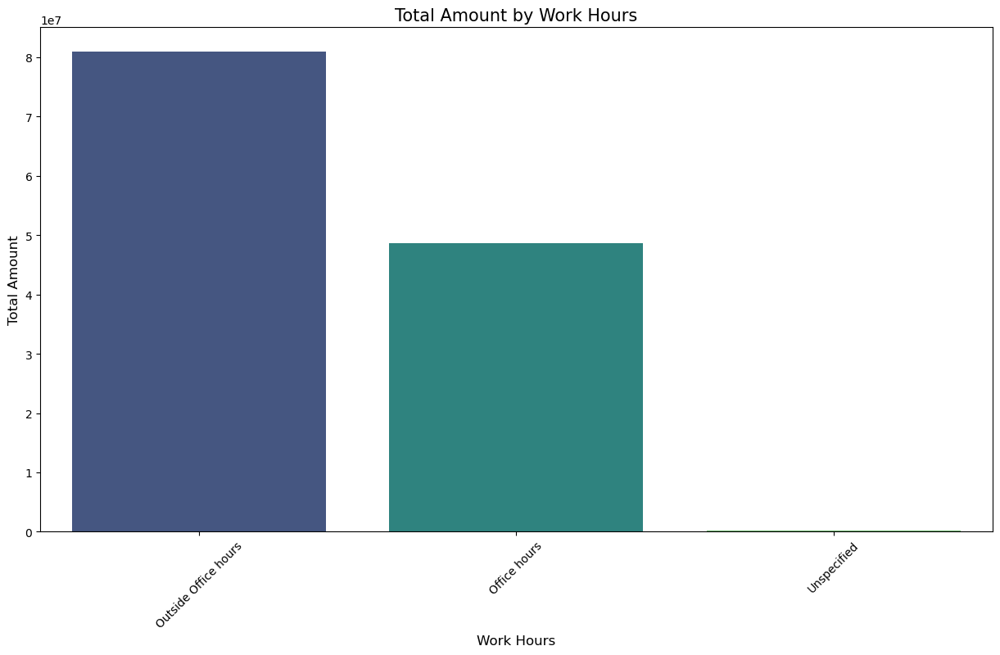

In [177]:
plt.figure(figsize=(15, 8))

# Aggregate data by 'Work Hours' and sum 'Total_Amount'
sorted_df = df_us.groupby('Work Hours')['Total_Amount'].sum().sort_values(ascending=False).reset_index()

# Create a barplot with the sorted data
sns.barplot(x='Work Hours', y='Total_Amount', data=sorted_df, palette='viridis')

# Set plot title and labels
plt.title('Total Amount by Work Hours', fontsize=15)
plt.xlabel('Work Hours', fontsize=12)
plt.ylabel('Total Amount', fontsize=12)

# Rotate x-axis labels if needed for readability
plt.xticks(rotation=45)

# Display the plot
plt.show()

In [178]:
df_us['Day']=df_us['Day'].astype(dtype='int')

In [179]:
df_us.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95174 entries, 17800 to 302009
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   State             95174 non-null  object 
 1   Country           95174 non-null  object 
 2   Age               95174 non-null  int32  
 3   Gender            95174 non-null  object 
 4   Income            95174 non-null  object 
 5   Year              95174 non-null  object 
 6   Month             95174 non-null  object 
 7   Total_Purchases   95174 non-null  int32  
 8   Amount            95174 non-null  float64
 9   Total_Amount      95174 non-null  float64
 10  Product_Category  95174 non-null  object 
 11  Product_Type      95174 non-null  object 
 12  Feedback          95174 non-null  object 
 13  Shipping_Method   95174 non-null  object 
 14  Payment_Method    95174 non-null  object 
 15  Order_Status      95174 non-null  object 
 16  Ratings           95174 non-null  int32 

In [180]:
num=df_us.select_dtypes(include=np.number).columns.to_list()
cat=df_us.select_dtypes(exclude=np.number).columns.to_list()

In [181]:
cat=['State',
 'Country',
 'Gender',
 'Income',
 'Year',
 'Month',
 'Product_Category',
 'Product_Type',
 'Feedback',
 'Shipping_Method',
 'Payment_Method',
 'Order_Status',
 'products',
 'Work Hours']
df_us['Work Hours'].unique()
#Label Encoder = 'State','Month','Product_Type','Product_Category','Feedback','products',
#Get dummies = 'Gender','Income','Year','Shipping_Method','Payment_Method','Order_Status','Work Hours'

array(['Outside Office hours', 'Office hours', 'Unspecified'],
      dtype=object)

In [182]:
df_us.columns.to_list()

['State',
 'Country',
 'Age',
 'Gender',
 'Income',
 'Year',
 'Month',
 'Total_Purchases',
 'Amount',
 'Total_Amount',
 'Product_Category',
 'Product_Type',
 'Feedback',
 'Shipping_Method',
 'Payment_Method',
 'Order_Status',
 'Ratings',
 'products',
 'Day',
 'Work Hours']

In [183]:
region_map = {
    "North": ["Maine", "New Hampshire", "Vermont", "Massachusetts", "Rhode Island", "Connecticut",
              "New York", "Pennsylvania", "New Jersey", "Delaware", "Maryland"],

    "South": ["Virginia", "North Carolina", "South Carolina", "Georgia", "Florida", "Alabama",
              "Mississippi", "Louisiana", "Texas", "Arkansas", "Oklahoma"],
    "East": ["Virginia", "North Carolina", "South Carolina", "Georgia", "Florida"],
    "Midwest": ["Wisconsin", "Michigan", "Minnesota", "Indiana", "Iowa",
                "Illinois", "Ohio", "Missouri", "West Virginia", "Kansas",
                "Kentucky", "Tennessee"],
    "West": ["Montana", "Idaho", "Wyoming", "Nebraska", "South Dakota", "North Dakota",
             "Utah", "Colorado", "Arizona", "New Mexico", "Nevada", "California",
             "Oregon", "Washington", "Alaska", "Hawaii"]
}


# Function to assign regions based on the state
def assign_region(state):
    for region, states_in_region in region_map.items():
        if state in states_in_region:
            return region
    return "Unknown"

# Apply the function to the DataFrame
df_us['Region'] = df_us['State'].apply(assign_region)
df_us.drop(columns='State',inplace=True)

In [184]:
from sklearn.preprocessing import *
from sklearn.linear_model import *
from sklearn.model_selection import *
from sklearn.metrics import *

In [185]:
label_encoder = LabelEncoder()

# Columns to encode
columns_to_encode = ['Month', 'Product_Type', 'Product_Category', 'Feedback', 'products']

# Apply LabelEncoder to each column
for column in columns_to_encode:
    df_us[column] = label_encoder.fit_transform(df_us[column])


In [186]:
columns_to_encode = ['Country','Gender', 'Income', 'Year', 'Shipping_Method', 'Payment_Method', 'Order_Status', 'Work Hours']

# Apply get_dummies to these columns and convert the dummy variables to integer type
df_dummies = pd.get_dummies(df_us[columns_to_encode], drop_first=True, dtype=int)

# Concatenate the dummy variables with the original DataFrame
df_us = pd.concat([df_us, df_dummies], axis=1)

# Drop the original categorical columns if they are no longer needed
df_us.drop(columns=columns_to_encode, inplace=True)

In [187]:
region_dummies = pd.get_dummies(df_us['Region'], prefix='Region',dtype=int)

# Concatenate the original DataFrame with the new one-hot encoded columns
df_us = pd.concat([df_us, region_dummies], axis=1)

# Drop the original 'region' column
df_us = df_us.drop('Region', axis=1)

In [188]:
df_us.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95174 entries, 17800 to 302009
Data columns (total 29 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Age                              95174 non-null  int32  
 1   Month                            95174 non-null  int32  
 2   Total_Purchases                  95174 non-null  int32  
 3   Amount                           95174 non-null  float64
 4   Total_Amount                     95174 non-null  float64
 5   Product_Category                 95174 non-null  int32  
 6   Product_Type                     95174 non-null  int32  
 7   Feedback                         95174 non-null  int32  
 8   Ratings                          95174 non-null  int32  
 9   products                         95174 non-null  int32  
 10  Day                              95174 non-null  int32  
 11  Gender_Male                      95174 non-null  int32  
 12  Income_Low        

In [189]:
from sklearn.decomposition import PCA
from sklearn.cluster import *

In [190]:
df_scaled=StandardScaler().fit_transform(df_us)

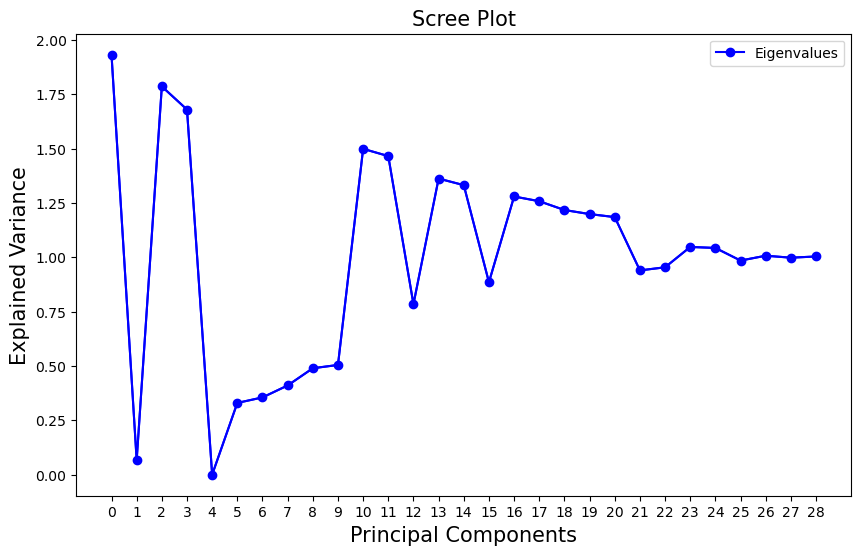

In [191]:
cov_mat = np.cov(df_scaled.T)

# Compute eigenvalues and eigenvectors
eig_val, eig_vec = np.linalg.eig(cov_mat)
eig_val = list(eig_val)

# Create an index for each principal component
pc_indices = np.arange(len(eig_val))

# Create the scree plot
plt.figure(figsize=(10, 6))

# Plot eigenvalues with blue color and 'o' marker
plt.plot(pc_indices, eig_val, 'bo-', label='Eigenvalues')

# Add a line plot for the eigenvalues
plt.plot(pc_indices, eig_val, 'b-')

# Set the axes and plot labels
plt.title('Scree Plot', fontsize=15)
plt.xlabel('Principal Components', fontsize=15)
plt.ylabel('Explained Variance', fontsize=15)

# Set x-axis ticks to show principal component indices
plt.xticks(pc_indices)

# Display the legend
plt.legend()

# Show the plot
plt.show()

In [192]:
percent_var = []

# use a 'for' loop to calculate the percentage of variation for each component
for i in eig_val:
    variation = (i/sum(eig_val))*100

    # add the values to the list 'percent_var'
    percent_var.append(variation)

# print the percentage of variation
percent_var

[6.661085199077502,
 0.23074269954066975,
 6.157803159651176,
 5.791615411359287,
 1.2125764911941663e-15,
 1.138691590806518,
 1.2260268231329219,
 1.4154375747973003,
 1.6886346111324817,
 1.7408802477038248,
 5.16861124516813,
 5.053278613314549,
 2.7046260420268626,
 4.6967227217635115,
 4.592686973624275,
 3.052693173081269,
 4.412529217273747,
 4.337543372050582,
 4.19836636298359,
 4.1336673307275875,
 4.085925838205089,
 3.2404748207430987,
 3.2897258506626184,
 3.6124778779607944,
 3.5965019138955667,
 3.3965180080673547,
 3.473381968134993,
 3.442120285673523,
 3.4612310674411653]

In [193]:
cum_sum=np.cumsum(percent_var)
cum_sum

array([  6.6610852 ,   6.8918279 ,  13.04963106,  18.84124647,
        18.84124647,  19.97993806,  21.20596488,  22.62140246,
        24.31003707,  26.05091732,  31.21952856,  36.27280718,
        38.97743322,  43.67415594,  48.26684291,  51.31953609,
        55.7320653 ,  60.06960868,  64.26797504,  68.40164237,
        72.48756821,  75.72804303,  79.01776888,  82.63024676,
        86.22674867,  89.62326668,  93.09664865,  96.53876893,
       100.        ])

In [194]:
## Considering 90% of variation, I'm taking it as <=89% variation

k= cum_sum[cum_sum<89]
len(k)

25

In [195]:
pca = PCA(n_components=25)
mypca = pca.fit_transform(df_scaled)
pca_df=pd.DataFrame(mypca,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20','PC21','PC22','PC23','PC24','PC25'])
pca_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25
0,-0.029333,2.275204,0.544162,0.545750,-1.004573,-1.532251,2.373030,0.426336,0.199564,0.106268,-0.768433,-0.541300,-1.240606,0.564802,-1.386107,1.036206,0.020657,1.868367,0.850572,-0.230621,-0.367942,0.467050,0.984317,0.287614,1.330071
1,-0.271059,0.121186,1.123305,2.079449,-0.536308,0.207687,0.255665,2.095351,1.697693,1.055999,-0.597914,2.035683,-0.900280,0.839084,-0.807895,-1.098691,1.721120,-1.242405,0.738653,-1.967937,-0.163040,0.593877,-0.499370,-0.051437,0.530626
2,2.542819,-0.203580,1.550600,-0.777504,-1.414719,0.641538,-0.270505,0.978232,0.640452,1.029718,-1.466751,0.229511,-0.553072,-0.037848,1.074235,0.569817,0.111108,-1.410573,0.638039,-1.203169,-0.117499,-1.405156,-0.412044,-0.317887,0.772632
3,1.997390,0.509375,0.835925,0.445388,-0.763621,-0.648343,1.225555,-1.170780,-0.098255,0.120554,-1.029428,1.112579,1.087393,-0.993947,-0.807798,0.842685,0.886631,1.946097,-0.686276,0.078229,-0.111379,-0.979342,1.071904,-0.184103,1.195534
4,0.114177,0.108739,0.641606,2.132351,-0.319848,0.499820,1.760206,-1.923448,-0.593301,0.398289,-1.661412,-0.281730,1.392053,-0.121439,0.277286,-1.548658,-0.957596,-0.523595,-0.951774,-0.704296,0.374774,0.297108,-0.433271,-0.141553,1.433295


In [196]:
## From screeplot, I am assuming that from point '4', screeplot is dividing
## So I'm taking n_clusters=4
km=KMeans(n_clusters=4,random_state=42)
km.fit(pca_df)

KMeans(n_clusters=4, random_state=42)

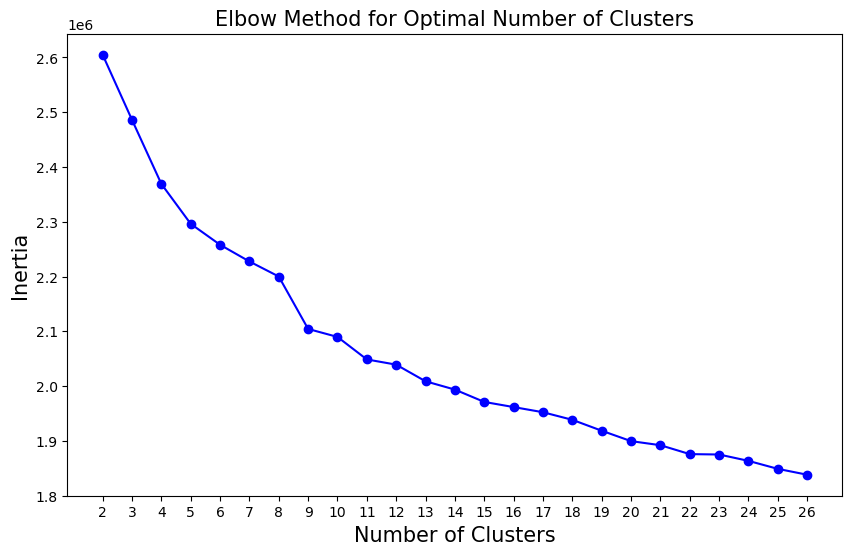

In [197]:
err = []

# Perform KMeans clustering for a range of cluster numbers
for i in range(2, 27):
    km1 = KMeans(n_clusters=i, random_state=42)
    km1.fit(df_scaled)
    err.append(km1.inertia_)

# Create the plot
plt.figure(figsize=(10, 6))

# Plot the inertia values against the number of clusters
plt.plot(range(2, 27), err, marker='o', linestyle='-', color='b')

# Set plot title and labels
plt.title('Elbow Method for Optimal Number of Clusters', fontsize=15)
plt.xlabel('Number of Clusters', fontsize=15)
plt.ylabel('Inertia', fontsize=15)

# Set x-axis ticks to show each integer value from 2 to 27
plt.xticks(range(2, 27))

plt.show()

In [198]:
labels = km.labels_
labels

array([0, 3, 3, ..., 0, 1, 2])

In [199]:
df_us['Labels']=km.labels_

In [230]:
df_us.Labels.value_counts(normalize=True)

Labels
1    0.378917
2    0.228382
3    0.196892
0    0.195810
Name: proportion, dtype: float64

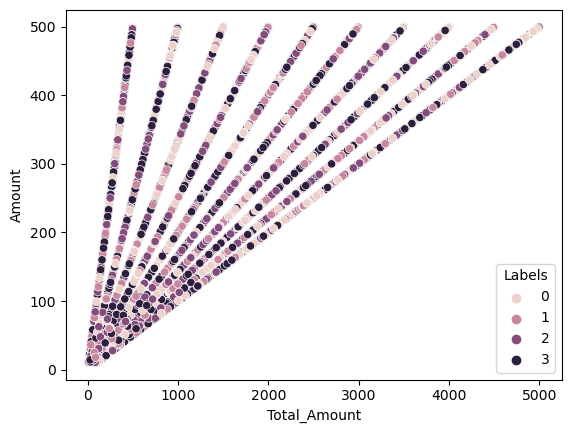

In [248]:
sns.scatterplot(x=df_us["Total_Amount"],y=df_us["Amount"],hue=df_us['Labels'])
plt.show()

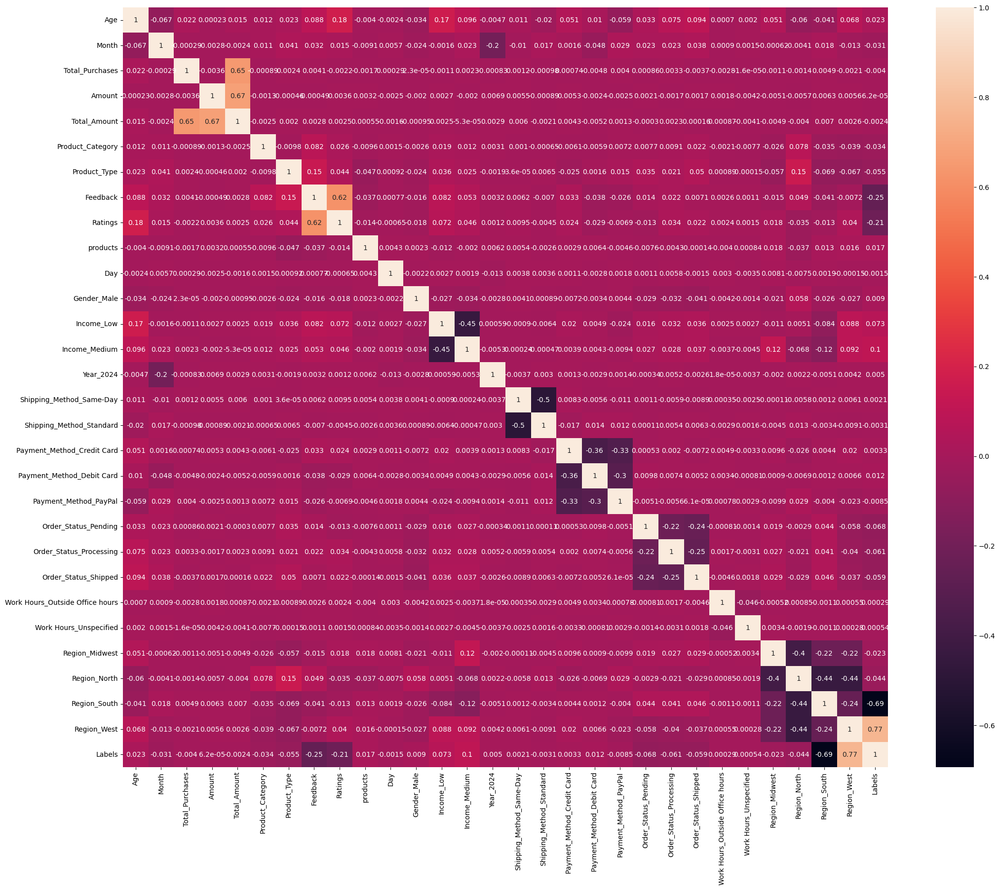

In [246]:
plt.figure(figsize=(25,20))
sns.heatmap(df_us.corr(),annot=True)
plt.show()

In [239]:
df_us.head()

,Age,Month,Total_Purchases,Amount,Total_Amount,Product_Category,Product_Type,Feedback,Ratings,products,Day,Gender_Male,Income_Low,Income_Medium,Year_2024,Shipping_Method_Same-Day,Shipping_Method_Standard,Payment_Method_Credit Card,Payment_Method_Debit Card,Payment_Method_PayPal,Order_Status_Pending,Order_Status_Processing,Order_Status_Shipped,Work Hours_Outside Office hours,Work Hours_Unspecified,Region_Midwest,Region_North,Region_South,Region_West,Labels
17800,19,10,6,241.823076,1450.938458,4,10,0,2,20,26,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0
17807,19,3,9,93.552348,841.971130,0,20,2,4,224,27,0,0,1,1,0,1,0,0,1,0,0,0,1,0,0,0,0,1,3
17815,19,2,7,494.749655,3463.247584,1,22,3,3,261,11,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,3
17841,19,2,7,437.822368,3064.756579,4,10,2,4,102,29,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
17844,19,9,8,170.082122,1360.656973,1,22,3,4,168,4,1,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0


In [200]:
df_us.Day=df_us.Day.astype('int32')

In [201]:
df_us.dtypes

Age                                  int32
Month                                int32
Total_Purchases                      int32
Amount                             float64
Total_Amount                       float64
Product_Category                     int32
Product_Type                         int32
Feedback                             int32
Ratings                              int32
products                             int32
Day                                  int32
Gender_Male                          int32
Income_Low                           int32
Income_Medium                        int32
Year_2024                            int32
Shipping_Method_Same-Day             int32
Shipping_Method_Standard             int32
Payment_Method_Credit Card           int32
Payment_Method_Debit Card            int32
Payment_Method_PayPal                int32
Order_Status_Pending                 int32
Order_Status_Processing              int32
Order_Status_Shipped                 int32
Work Hours_

In [202]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, cohen_kappa_score, classification_report
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Calculate VIF for each feature
def calculate_vif(df):
    df_with_const = add_constant(df)  # Add a constant column for VIF calculation
    vif_data = pd.DataFrame()
    vif_data["Feature"] = df_with_const.columns
    vif_data["VIF"] = [variance_inflation_factor(df_with_const.values, i)
                       for i in range(df_with_const.shape[1])]
    return vif_data

# Prepare features and target variable
X = df_us.drop('Labels', axis=1)  # Features
y = df_us['Labels']               # Target variable

# Calculate VIF and remove features with high VIF
vif_data=calculate_vif(X)
high_vif_features = vif_data[vif_data["VIF"] > 10]["Feature"]

print("Features with high VIF values:")
print(high_vif_features)

# Remove features with high VIF
X = X.drop(columns=high_vif_features, errors='ignore')

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)



Features with high VIF values:
26    Region_Midwest
27      Region_North
28      Region_South
29       Region_West
Name: Feature, dtype: object


In [231]:
from scipy import stats

In [233]:
def ttest_ind(train,test,feature):
    stat,pval = stats.ttest_ind(train[feature],test[feature])
    return pval

In [235]:
for i in X_train.columns:
    pvalue= ttest_ind(X_train,X_test,i)
    print(i,pvalue)

Age 0.3629803393397587
Month 0.6788753670120447
Total_Purchases 0.37696129517183363
Amount 0.34545754189033484
Total_Amount 0.15881659634124712
Product_Category 0.3538043658526401
Product_Type 0.9698692090194195
Feedback 0.7236738709219459
Ratings 0.9314849804432446
products 0.2765572071260019
Day 0.9226768239128846
Gender_Male 0.22253902918601243
Income_Low 0.8872665352557392
Income_Medium 0.3862301165808234
Year_2024 0.16079262078360484
Shipping_Method_Same-Day 0.4347056475729649
Shipping_Method_Standard 0.9570215482893629
Payment_Method_Credit Card 0.31334381545985607
Payment_Method_Debit Card 0.5442564501327052
Payment_Method_PayPal 0.6389646584267821
Order_Status_Pending 0.34499588263760406
Order_Status_Processing 0.46668911738728236
Order_Status_Shipped 0.10535303679634499
Work Hours_Outside Office hours 0.2924812595762327
Work Hours_Unspecified 0.6900009791668241


In [203]:
# Initialize the Logistic Regression model
model = LogisticRegression(max_iter=1000)

# Train the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='weighted')
kappa = cohen_kappa_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Print the results
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Cohen's Kappa: {kappa:.4f}")
print("Classification Report:")
print(report)

Accuracy: 0.5950
F1 Score: 0.4704
Cohen's Kappa: 0.4091
Classification Report:
              precision    recall  f1-score   support

           0       0.30      0.01      0.02      5541
           1       0.61      0.96      0.75     10756
           2       0.60      0.98      0.75      6501
           3       0.29      0.04      0.08      5755

    accuracy                           0.60     28553
   macro avg       0.45      0.50      0.40     28553
weighted avg       0.48      0.60      0.47     28553



In [204]:
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier,BaggingClassifier,RandomForestClassifier,StackingClassifier,VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

In [217]:
def evaluate_model(model, x_train, y_train, x_test, y_test):
  # Fit the model
  model.fit(x_train, y_train)

  # Make predictions
  predicted_train = model.predict(x_train)
  predicted_test = model.predict(x_test)

  # Get predicted probabilities
  y_train_proba = model.predict_proba(x_train)
  y_test_proba = model.predict_proba(x_test)

  # Compute metrics
  train_matrix = confusion_matrix(y_train, predicted_train)
  test_matrix = confusion_matrix(y_test, predicted_test)

  # One-vs-Rest strategy for multi-class ROC AUC
  train_auroc = roc_auc_score(y_train, y_train_proba, multi_class='ovr', average='weighted')
  test_auroc = roc_auc_score(y_test, y_test_proba, multi_class='ovr', average='weighted')

  train_recall = recall_score(y_train, predicted_train, average='weighted')
  test_recall = recall_score(y_test, predicted_test, average='weighted')

  train_precision = precision_score(y_train, predicted_train, average='weighted')
  test_precision = precision_score(y_test, predicted_test, average='weighted')

  train_f1 = f1_score(y_train, predicted_train, average='weighted')
  test_f1 = f1_score(y_test, predicted_test, average='weighted')

  train_accuracy = accuracy_score(y_train, predicted_train)
  test_accuracy = accuracy_score(y_test, predicted_test)

  # Create DataFrames directly with dictionaries
  test_scorecard = pd.Series({
      'Model': str(model),
      'Accuracy_test': test_accuracy,
      'Precision_test': test_precision,
      'Recall_test': test_recall,
      'F1 Score_test': test_f1
  })

  train_scorecard = pd.Series({
      'Model': str(model),
      'Accuracy_train': train_accuracy,
      'Precision_train': train_precision,
      'Recall_train': train_recall,
      'F1 Score_train': train_f1
  })

  return test_scorecard, train_scorecard



In [218]:
# Example Usage (assuming you have multiple models to evaluate)
models = [DecisionTreeClassifier(),RandomForestClassifier(),AdaBoostClassifier(),BaggingClassifier(),XGBClassifier()]  # List of models
test_scorecards = []
train_scorecards = []

for model in models:
  test_scorecard, train_scorecard = evaluate_model(model, X_train, y_train, X_test, y_test)
  test_scorecards.append(test_scorecard)
  train_scorecards.append(train_scorecard)

# Now you can use the test_scorecards and train_scorecards DataFrames for further analysis

In [219]:
test_scorecards

[Model             DecisionTreeClassifier()
 Accuracy_test                     0.619935
 Precision_test                    0.621297
 Recall_test                       0.619935
 F1 Score_test                     0.620547
 dtype: object,
 Model             RandomForestClassifier()
 Accuracy_test                     0.700347
 Precision_test                    0.708962
 Recall_test                       0.700347
 F1 Score_test                     0.666671
 dtype: object,
 Model             AdaBoostClassifier()
 Accuracy_test                 0.348019
 Precision_test                0.475722
 Recall_test                   0.348019
 F1 Score_test                  0.35051
 dtype: object,
 Model             BaggingClassifier()
 Accuracy_test                0.670262
 Precision_test               0.656467
 Recall_test                  0.670262
 F1 Score_test                0.658792
 dtype: object,
 Model             XGBClassifier(base_score=None, booster=None, c...
 Accuracy_test                  

In [220]:
train_scorecards

[Model              DecisionTreeClassifier()
 Accuracy_train                          1.0
 Precision_train                         1.0
 Recall_train                            1.0
 F1 Score_train                          1.0
 dtype: object,
 Model              RandomForestClassifier()
 Accuracy_train                          1.0
 Precision_train                         1.0
 Recall_train                            1.0
 F1 Score_train                          1.0
 dtype: object,
 Model              AdaBoostClassifier()
 Accuracy_train                 0.348524
 Precision_train                0.480619
 Recall_train                   0.348524
 F1 Score_train                 0.352525
 dtype: object,
 Model              BaggingClassifier()
 Accuracy_train                0.986716
 Precision_train               0.986773
 Recall_train                  0.986716
 F1 Score_train                0.986695
 dtype: object,
 Model              XGBClassifier(base_score=None, booster=None, c...
 Accuracy_t

In [222]:
evaluate_model(XGBClassifier(), X_train, y_train, X_test, y_test)

(Model             XGBClassifier(base_score=None, booster=None, c...
 Accuracy_test                                              0.695689
 Precision_test                                             0.686999
 Recall_test                                                0.695689
 F1 Score_test                                              0.670804
 dtype: object,
 Model              XGBClassifier(base_score=None, booster=None, c...
 Accuracy_train                                              0.796085
 Precision_train                                             0.805783
 Recall_train                                                0.796085
 F1 Score_train                                              0.784339
 dtype: object)

In [224]:
param={'n_estimators':[70,100,120,150,100],
      'learning_rate':[1,0.5,0.1,0.01],
      'max_depth':[3,4,5,6,7,8,9,11]}

gsv=GridSearchCV(estimator=XGBClassifier(),param_grid=param,scoring='f1',verbose=1)


In [225]:
gsv.fit(X_train,y_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_b...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             param_grid={'learning_rate': [1, 0.5, 0.1, 0.01],
                         'max_depth': [3, 4, 5, 6, 7, 8, 9, 11],
                         'n_estimators': [70, 100, 120, 150, 100]},
             scoring='f1', verbose=1)

In [227]:
gsv.best_params_

{'learning_rate': 1, 'max_depth': 3, 'n_estimators': 70}

In [249]:
evaluate_model(XGBClassifier(**gsv.best_params_),X_train,y_train,X_test,y_test)

(Model             XGBClassifier(base_score=None, booster=None, c...
 Accuracy_test                                              0.697405
 Precision_test                                             0.691197
 Recall_test                                                0.697405
 F1 Score_test                                              0.670326
 dtype: object,
 Model              XGBClassifier(base_score=None, booster=None, c...
 Accuracy_train                                              0.726813
 Precision_train                                             0.729233
 Recall_train                                                0.726813
 F1 Score_train                                              0.703038
 dtype: object)